<a href="https://colab.research.google.com/github/HHafida/OC_P8_Participez-une-comp-tition-Kaggle-/blob/main/IML_P8__Nettoyage_et_analyse_exploratoire.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Importation des librairies et jeux de donnée


In [ ]:
# import des librairies dont nous aurons besoin

import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn import decomposition, preprocessing,cluster
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn import neighbors
from scipy.stats import t, shapiro
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importation du fichier test

df ='/content/drive/MyDrive/test.csv'
test = pd.read_csv(df)

# Importation du fichier test

df ='/content/drive/MyDrive/train.csv'
train = pd.read_csv(df)

# 2. Nettoyage du dataset

### 2.1 Definition des variables et exploration initiale



* SalePrice - le prix de vente de la propriété en dollars (variable cible à prédire).
* MSSubClass - la classe de construction

    MSZoning - la classification générale de zonage.

    LotFrontage - pieds linéaires de rue reliés à la propriété.

    LotArea - la superficie du terrain en pieds carrés.

    Street - le type d'accès à la route.

    Alley - le type d'accès à l'allée.

    LotShape - la forme générale de la propriété.

    LandContour - le degré de planéité de la propriété.

    Utilities - le type de services publics disponibles.

    LotConfig - la configuration du terrain.

    LandSlope - la pente du terrain.

    Neighborhood - les emplacements physiques dans les limites de la ville d'Ames.

    Condition1 - la proximité de la route principale ou du chemin de fer.

    Condition2 - la proximité de la deuxième route principale ou du chemin de fer (si présent).

    BldgType - le type de logement.

    HouseStyle - le style de logement.

    OverallQual - la qualité globale des matériaux et de la finition.

    OverallCond - l'évaluation globale de l'état.

    YearBuilt - la date de construction initiale.

    YearRemodAdd - la date de rénovation.

    RoofStyle - le type de toit.

    RoofMatl - le matériau de toiture.

    Exterior1st - le revêtement extérieur de la maison.

    Exterior2nd - le revêtement extérieur de la maison (si plusieurs matériaux).

    MasVnrType - le type de parement en maçonnerie.

    MasVnrArea - la superficie du parement en maçonnerie en pieds carrés.

    ExterQual - la qualité du matériau extérieur.

    ExterCond - l'état actuel du matériau extérieur.

    Foundation - le type de fondation.

    BsmtQual - la hauteur du sous-sol.

    BsmtCond - l'état général du sous-sol.

    BsmtExposure - les murs du sous-sol exposés au niveau du jardin ou de la sortie.

    BsmtFinType1 - la qualité de la surface habitable du sous-sol de type 1.

    BsmtFinSF1 - la superficie habitable finie de type 1 en pieds carrés.

    BsmtFinType2 - la qualité de la deuxième surface habitable finie (si présente).

    BsmtFinSF2 - la superficie habitable finie de type 2 en pieds carrés.

    BsmtUnfSF - la superficie non finie du sous-sol en pieds carrés.

    TotalBsmtSF - la superficie totale du sous-sol en pieds carrés.

    Heating - le type de chauffage.

    HeatingQC - la qualité et l'état du chauffage.

    CentralAir - la climatisation centrale.

    Electrical - le système électrique.

    1stFlrSF - la superficie du premier étage en pieds carrés.

    2ndFlrSF - la superficie du deuxième étage en pieds carrés.

    LowQualFinSF - la superficie finie de faible qualité (tous les étages).

    GrLivArea : Superficie habitable au-dessus du sol en pieds carrés.

    BsmtFullBath : Salles de bains complètes dans le sous-sol.

    BsmtHalfBath : Salles de bains partielles dans le sous-sol.

    FullBath : Salles de bains complètes au-dessus du sol.

    HalfBath : Salles de bains partielles au-dessus du sol.

    Bedroom : Nombre de chambres au-dessus du niveau du sous-sol.

    Kitchen : Nombre de cuisines.

    KitchenQual : Qualité de la cuisine.

    TotRmsAbvGrd : Nombre total de pièces au-dessus du sol (ne comprend pas les salles de bains).

    Functional : Évaluation de la fonctionnalité de la maison.

    Fireplaces : Nombre de cheminées.

    FireplaceQu : Qualité de la cheminée.

    GarageType : Emplacement du garage.

    GarageYrBlt : Année de construction du garage.

    GarageFinish : Finition intérieure du garage.

    GarageCars : Capacité du garage en nombre de voitures.

    GarageArea : Superficie du garage en pieds carrés.

    GarageQual : Qualité du garage.

    GarageCond : État du garage.

    PavedDrive : Allée pavée.

    WoodDeckSF : Superficie du pont en bois en pieds carrés.

    OpenPorchSF : Superficie de la véranda ouverte en pieds carrés.

    EnclosedPorch : Superficie de la véranda fermée en pieds carrés.

    3SsnPorch : Superficie de la véranda à trois saisons en pieds carrés.

    ScreenPorch : Superficie de la véranda avec écran en pieds carrés.

    PoolArea : Superficie de la piscine en pieds carrés.

    PoolQC : Qualité de la piscine.

    Fence : Qualité de la clôture.

    MiscFeature : Caractéristique diverse non couverte par les autres catégories.

    MiscVal : Valeur en dollars de la caractéristique diverse.

    MasVnrArea : surface totale de la maçonnerie qui recouvre les murs extérieurs d'un bâtiment

    MoSold : Mois de la vente.

    YrSold : Année de la vente.

    SaleType : Type de vente.

    SaleCondition : État de la vente.




**Objectif** :

 prédire le prix de vente pour chaque maison dans l'ensemble de test.

  Les soumissions seront évaluées en fonction de l'erreur quadratique moyenne (RMSE) entre le logarithme de la valeur prédite et le logarithme du prix de vente observé. Cette transformation logarithmique garantit que les erreurs dans la prédiction des maisons coûteuses et des maisons bon marché auront le même impact sur le résultat.

In [ ]:
pd.set_option('display.max_columns', None)
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
train.shape


(1460, 81)

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [ ]:
test.shape

(1459, 80)

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

Ici nous avons 2 sets de données (train ayant la valeur a prédire "Saleprice") avec des tailles homogènes a priori il semble que quelques colonnes présente un important nombre de valeurs manquantes au lieu de fusionner les deux sets pour proceder au nettoyage nous allons faire de fonction afin de pouvoir les appliquer à nos 2 jeux de données

In [ ]:
# Fonction pour afficher le pourcentage des valeurs nulls et les visualiser


def valeur_null(df, pourcentage=True, msno_plot=True):
    # 1. Nombre de valeurs manquantes totales
    nb_nan_tot = df.isna().sum().sum()
    nb_donnees_tot = np.product(df.shape)
    pourc_nan_tot = round((nb_nan_tot / nb_donnees_tot) * 100, 2)
    print(f'Valeurs manquantes : {nb_nan_tot} NaN pour {nb_donnees_tot} données ({pourc_nan_tot} %)')

    if pourcentage:
        print("-------------------------------------------------------------")
        print("Nombre et pourcentage de valeurs manquantes par variable\n")
        # 2. Visualisation du nombre et du pourcentage de valeurs manquantes par variable
        values = df.isnull().sum()
        percentage = 100 * values / len(df)
        table = pd.concat([values, percentage.round(2)], axis=1)
        table.columns = ['Nombres de valeurs manquantes', '% de valeurs manquantes']
        display(table[table['Nombres de valeurs manquantes'] != 0].sort_values('% de valeurs manquantes', ascending=False))

    if msno_plot:
        print("-------------------------------------------------------------")
        print("Visualisation des valeurs manquantes")
        # 3. Visualisation des valeurs manquantes
        msno.bar(df, orientation='h')


Valeurs manquantes : 6965 NaN pour 118260 données (5.89 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
PoolQC,1453,99.52
MiscFeature,1406,96.30
Alley,1369,93.77
Fence,1179,80.75
FireplaceQu,690,47.26
LotFrontage,259,17.74
GarageType,81,5.55
GarageYrBlt,81,5.55
GarageFinish,81,5.55
GarageQual,81,5.55


-------------------------------------------------------------
Visualisation des valeurs manquantes


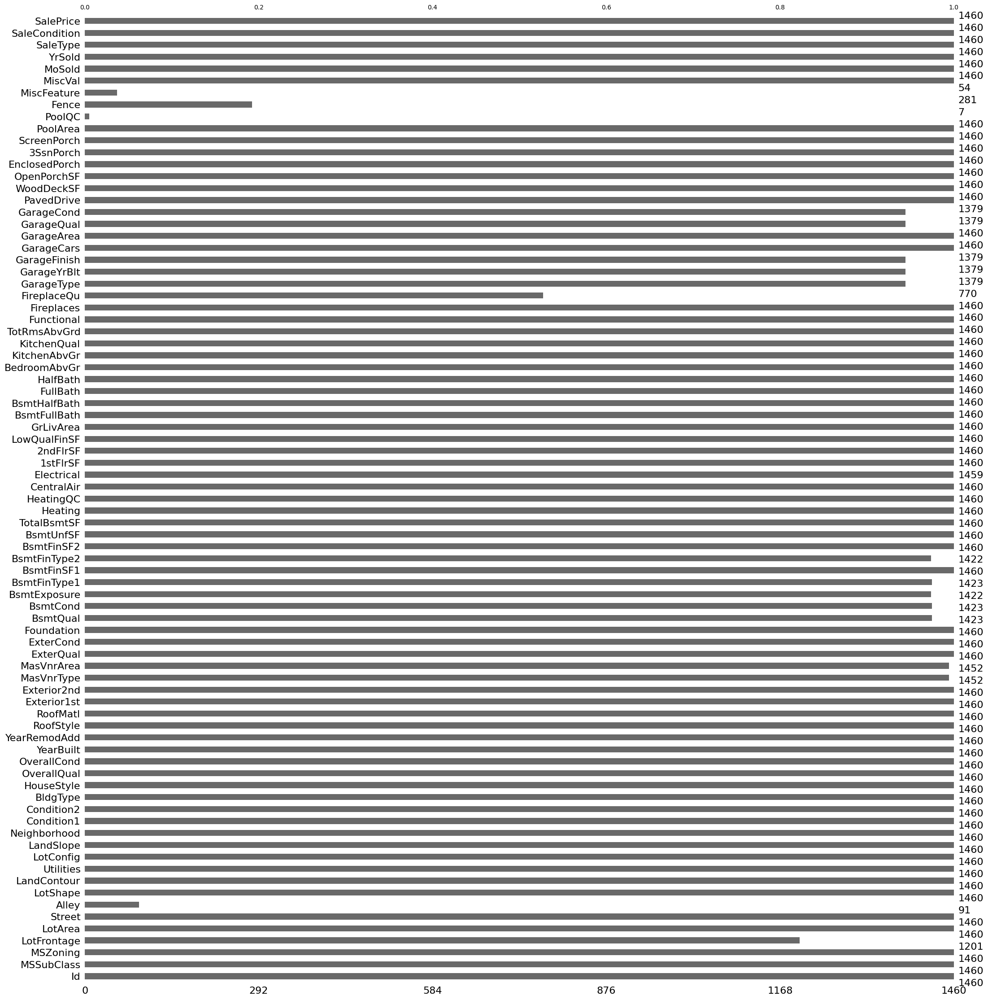

In [ ]:
valeur_null(train, True, True)

Valeurs manquantes : 7000 NaN pour 116720 données (6.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
PoolQC,1456,99.79
MiscFeature,1408,96.50
Alley,1352,92.67
Fence,1169,80.12
FireplaceQu,730,50.03
LotFrontage,227,15.56
GarageCond,78,5.35
GarageYrBlt,78,5.35
GarageQual,78,5.35
GarageFinish,78,5.35


-------------------------------------------------------------
Visualisation des valeurs manquantes


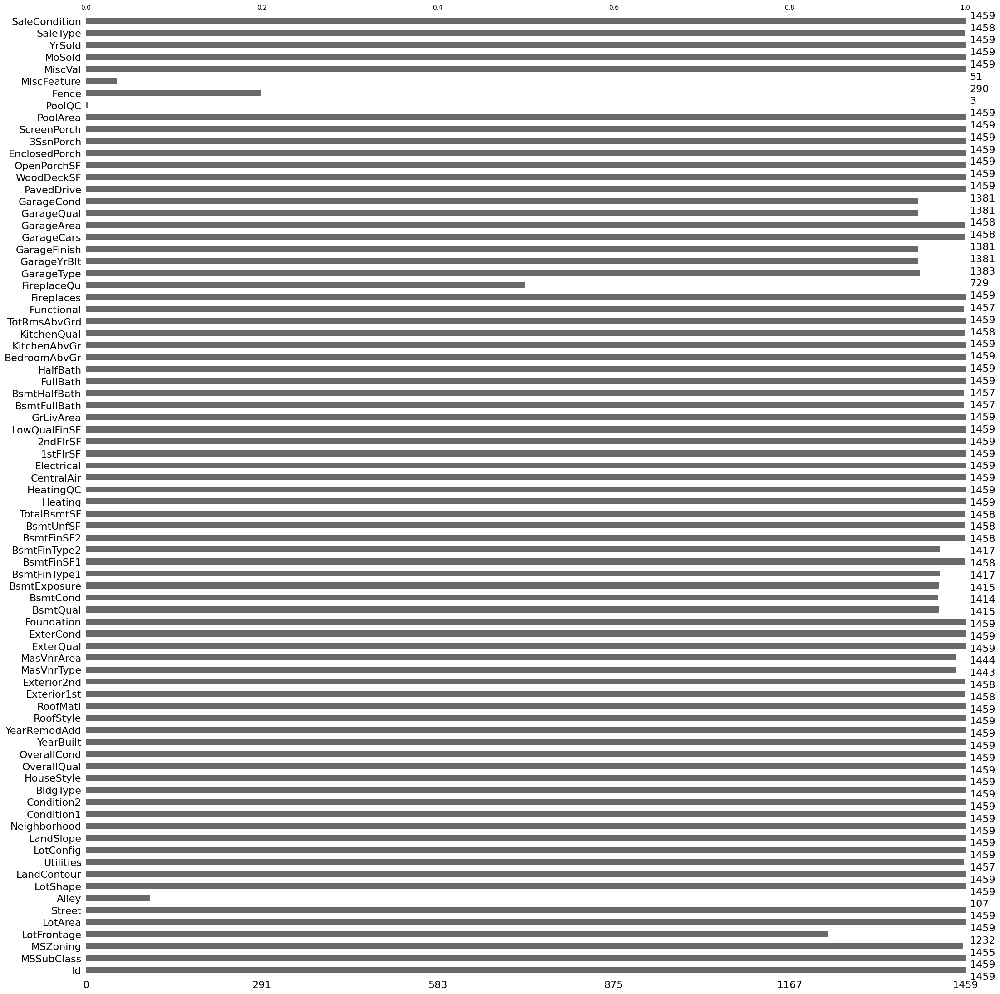

In [ ]:
valeur_null(test, True,True)

Nous avons respectivement 5.89% et 6% de valeurs manquantes dans nos train et test set. Ce qui reflète d'une part l'homogéneité des deux sets (valeurs manquantes présentes en même quantité dans les même colonnes) d'autre par cela nous conforte dans notre approche de traiter les deux sets de la même manière mais séparement.

###2.1 Traitement des valeurs manquantes

Nous decidons de supprimer les colonnes dont le pourcentage de valeur manquant est supérieur à 80%

In [ ]:
def supprimer_colonnes_valeurs_manquantes(df, seuil=0.8):

    # Calcul du pourcentage de valeurs manquantes par colonne
    pourcentage_valeurs_manquantes = df.isnull().sum() / len(df)

    # Sélection des colonnes ayant un pourcentage de valeurs manquantes supérieur au seuil
    colonnes_a_supprimer = pourcentage_valeurs_manquantes[pourcentage_valeurs_manquantes > seuil].index

    # Suppression des colonnes du DataFrame
    df_sans_colonnes = df.drop(colonnes_a_supprimer, axis=1)

    return df_sans_colonnes

In [ ]:
train = supprimer_colonnes_valeurs_manquantes(train, seuil=0.8)

<Axes: >

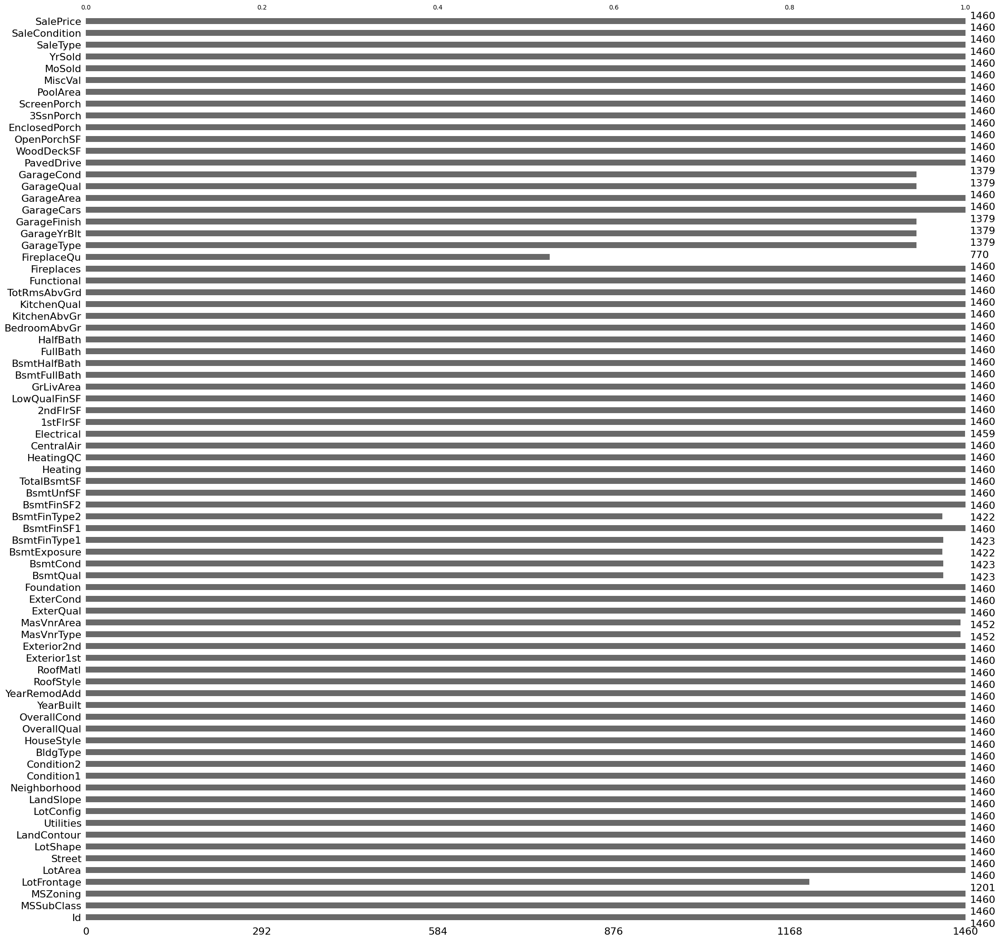

In [ ]:
msno.bar(train)

In [ ]:
test=supprimer_colonnes_valeurs_manquantes(test, seuil=0.8)

<Axes: >

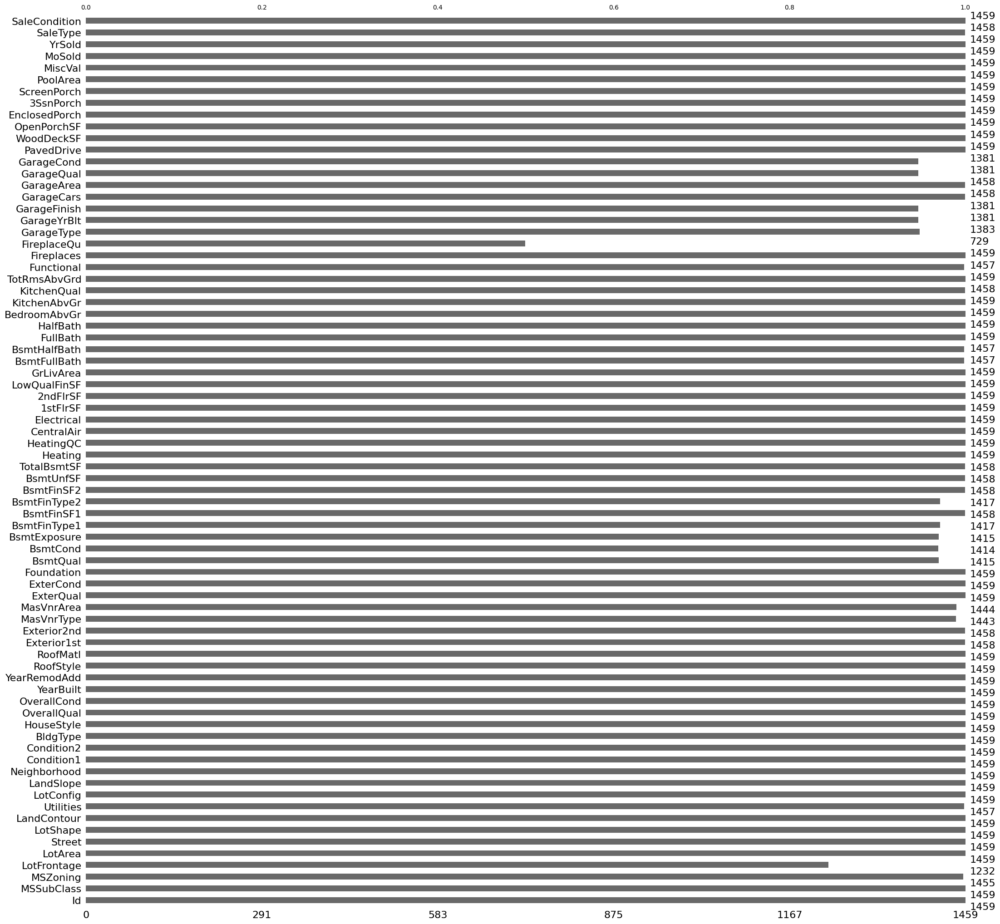

In [ ]:
msno.bar(test)

Nous remarquons que les colonnes ou il y a les valeurs manquantes concerne le garage, la salle de bain, cheminée, "MasVnrArea"(l'aire en pieds carrés (square feet) de l'habillage en maçonnerie (masonry veneer) d'un bâtiment), "MasVnrType" (type de matériau utilisé pour l'habillage en maçonnerie des murs extérieurs) et le lot

In [ ]:
def selectionner_colonnes_garage(df):
    # Sélection des colonnes contenant le mot "Garage" dans leur nom
    colonnes_garage = [colonne for colonne in df.columns if 'Garage' in colonne]

    # Création d'un nouveau DataFrame avec les colonnes sélectionnées
    df_selection_garage = df[colonnes_garage]

    return df_selection_garage

In [ ]:
train_garage = selectionner_colonnes_garage(train)

In [ ]:
pd.set_option('display.max_rows', None)
train_garage.loc[train_garage['GarageCars'] == 0]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NaN,NaN,NaN,0,0,NaN,NaN
48,NaN,NaN,NaN,0,0,NaN,NaN
78,NaN,NaN,NaN,0,0,NaN,NaN
88,NaN,NaN,NaN,0,0,NaN,NaN
89,NaN,NaN,NaN,0,0,NaN,NaN
99,NaN,NaN,NaN,0,0,NaN,NaN
108,NaN,NaN,NaN,0,0,NaN,NaN
125,NaN,NaN,NaN,0,0,NaN,NaN
127,NaN,NaN,NaN,0,0,NaN,NaN
140,NaN,NaN,NaN,0,0,NaN,NaN


In [ ]:
zero = train_garage.loc[train_garage['GarageCars'] == 0]
zero.isna().sum()

GarageType      81
GarageYrBlt     81
GarageFinish    81
GarageCars       0
GarageArea       0
GarageQual      81
GarageCond      81
dtype: int64

In [ ]:
train_garage.isna().sum()

GarageType      81
GarageYrBlt     81
GarageFinish    81
GarageCars       0
GarageArea       0
GarageQual      81
GarageCond      81
dtype: int64

Nous voyons que les NaN correspondent aux lignes ou il n'y a pas de garage sur la propriété ce qui est logique de ce fait nous imputerons les floats et int par 0 et les objects pas inexistant

In [ ]:
# Imputation pour les colonnes de type float et int
train_garage.update(train_garage.select_dtypes(include=['float', 'int']).fillna(0))

# Imputation pour les colonnes de type object
train_garage.update(train_garage.select_dtypes(include=['object']).fillna('inexistant'))

<ipython-input-23-0f8afe476415>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_garage.update(train_garage.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-23-0f8afe476415>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_garage.update(train_garage.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-23-0f8afe476415>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
train_garage.isna().sum()

GarageType      0
GarageYrBlt     0
GarageFinish    0
GarageCars      0
GarageArea      0
GarageQual      0
GarageCond      0
dtype: int64

In [ ]:
# Remplacement des colonnes de train par les colonnes traitées de train_garage
train.update(train_garage)

In [ ]:
# Vérification que les modifications on bien été faites
train.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

Nous ne voyons plus de NaN dans les colonnes type garage nous allons proceder aux mêmes modification sur le test set

In [ ]:
test_garage = selectionner_colonnes_garage(test)

In [ ]:
test_garage.loc[test_garage['GarageCars'] == 0]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
53,NaN,NaN,NaN,0.0,0.0,NaN,NaN
71,NaN,NaN,NaN,0.0,0.0,NaN,NaN
79,NaN,NaN,NaN,0.0,0.0,NaN,NaN
92,NaN,NaN,NaN,0.0,0.0,NaN,NaN
96,NaN,NaN,NaN,0.0,0.0,NaN,NaN
98,NaN,NaN,NaN,0.0,0.0,NaN,NaN
100,NaN,NaN,NaN,0.0,0.0,NaN,NaN
130,NaN,NaN,NaN,0.0,0.0,NaN,NaN
133,NaN,NaN,NaN,0.0,0.0,NaN,NaN
134,NaN,NaN,NaN,0.0,0.0,NaN,NaN


In [ ]:
zero = test_garage.loc[test_garage['GarageCars'] == 0]
zero.isna().sum()

GarageType      76
GarageYrBlt     76
GarageFinish    76
GarageCars       0
GarageArea       0
GarageQual      76
GarageCond      76
dtype: int64

In [ ]:
test_garage.isna().sum()

GarageType      76
GarageYrBlt     78
GarageFinish    78
GarageCars       1
GarageArea       1
GarageQual      78
GarageCond      78
dtype: int64

In [ ]:
nan_rows = test_garage[test_garage.isna().any(axis=1)]
nan_rows


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
53,NaN,NaN,NaN,0.0,0.0,NaN,NaN
71,NaN,NaN,NaN,0.0,0.0,NaN,NaN
79,NaN,NaN,NaN,0.0,0.0,NaN,NaN
92,NaN,NaN,NaN,0.0,0.0,NaN,NaN
96,NaN,NaN,NaN,0.0,0.0,NaN,NaN
98,NaN,NaN,NaN,0.0,0.0,NaN,NaN
100,NaN,NaN,NaN,0.0,0.0,NaN,NaN
130,NaN,NaN,NaN,0.0,0.0,NaN,NaN
133,NaN,NaN,NaN,0.0,0.0,NaN,NaN
134,NaN,NaN,NaN,0.0,0.0,NaN,NaN


Nous considérons que l'ensemble des valeurs non renseignés sont du à l'absence de garage excepte la ligne 666 nous imputerons quand même cette dernière par 0

In [ ]:
# Imputation pour les colonnes de type float et int
test_garage.update(test_garage.select_dtypes(include=['float', 'int']).fillna(0))

# Imputation pour les colonnes de type object
test_garage.update(test_garage.select_dtypes(include=['object']).fillna('inexistant'))

<ipython-input-32-e898d80cb0c5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_garage.update(test_garage.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-32-e898d80cb0c5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_garage.update(test_garage.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-32-e898d80cb0c5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

In [ ]:
# Remplacement des colonnes de train par les colonnes traitées de train_garage
test.update(test_garage)

In [ ]:
test.isna().sum()

Id                 0
MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          2
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          44
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinSF1         1
BsmtFinType2      42
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       2
BsmtHalfBath 

In [ ]:
def selectionner_colonnes_bsmt(df):
    # Sélection des colonnes contenant le mot "Bsmt" dans leur nom
    colonnes_bsmt = [colonne for colonne in df.columns if 'Bsmt' in colonne]

    # Création d'un nouveau DataFrame avec les colonnes sélectionnées
    df_selection_bsmt = df[colonnes_bsmt]

    return df_selection_bsmt

In [ ]:
train_bsmt = selectionner_colonnes_bsmt(train)
train_bsmt

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
0,Gd,TA,No,GLQ,706,Unf,0,150,856,1,0
1,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,0,1
2,Gd,TA,Mn,GLQ,486,Unf,0,434,920,1,0
3,TA,Gd,No,ALQ,216,Unf,0,540,756,1,0
4,Gd,TA,Av,GLQ,655,Unf,0,490,1145,1,0
5,Gd,TA,No,GLQ,732,Unf,0,64,796,1,0
6,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,1,0
7,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,1,0
8,TA,TA,No,Unf,0,Unf,0,952,952,0,0
9,TA,TA,No,GLQ,851,Unf,0,140,991,1,0


In [ ]:
nan_rows = train_bsmt[train_bsmt.isna().any(axis=1)]
nan_rows

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
332,Gd,TA,No,GLQ,1124,NaN,479,1603,3206,1,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0,0,0


Hors les row 942 et 332 que nous imputerons par la moyenne nous traiterons les NaN comme fait precedemment

In [ ]:
lignes_a_imputer = [332, 948]
train_bsmt.loc[lignes_a_imputer] = train_bsmt.loc[lignes_a_imputer].fillna(train_bsmt.mean())


<ipython-input-38-3c2fd43bde50>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  train_bsmt.loc[lignes_a_imputer] = train_bsmt.loc[lignes_a_imputer].fillna(train_bsmt.mean())


In [ ]:
# Imputation pour les colonnes de type float et int
train_bsmt.update(train_bsmt.select_dtypes(include=['float', 'int']).fillna(0))

# Imputation pour les colonnes de type object
train_bsmt.update(train_bsmt.select_dtypes(include=['object']).fillna('inexistant'))

<ipython-input-39-e64984b22a37>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_bsmt.update(train_bsmt.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-39-e64984b22a37>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_bsmt.update(train_bsmt.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-39-e64984b22a37>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [ ]:
# Remplacement des colonnes de train par les colonnes traitées de train_bsmt
train.update(train_bsmt)

In [ ]:
test_bsmt = selectionner_colonnes_bsmt(test)
test_bsmt

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
0,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,0.0,0.0
1,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,0.0,0.0
2,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,0.0,0.0
3,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,0.0,0.0
4,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,0.0,0.0
5,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,0.0,0.0
6,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,1.0,0.0
7,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,0.0,0.0
8,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,1.0,0.0
9,TA,TA,No,ALQ,804.0,Rec,78.0,0.0,882.0,1.0,0.0


In [ ]:
nan_rows = test_bsmt[test_bsmt.isna().any(axis=1)]
nan_rows

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
27,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
125,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
133,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
269,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
318,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
354,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
387,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
388,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
396,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
397,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [ ]:
lignes_a_imputer = [27, 580, 725, 757, 758, 888, 1064]
test_bsmt.loc[lignes_a_imputer] = test_bsmt.loc[lignes_a_imputer].fillna(test_bsmt.mean())


<ipython-input-43-b26a25d1ddc8>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  test_bsmt.loc[lignes_a_imputer] = test_bsmt.loc[lignes_a_imputer].fillna(test_bsmt.mean())


In [ ]:
# Imputation pour les colonnes de type float et int
test_bsmt.update(test_bsmt.select_dtypes(include=['float', 'int']).fillna(0))

# Imputation pour les colonnes de type object
test_bsmt.update(test_bsmt.select_dtypes(include=['object']).fillna('inexistant'))

<ipython-input-44-68220d4390bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_bsmt.update(test_bsmt.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-44-68220d4390bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_bsmt.update(test_bsmt.select_dtypes(include=['float', 'int']).fillna(0))
<ipython-input-44-68220d4390bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [ ]:
test.update(test_bsmt)

In [ ]:
test.isna().sum()

Id                 0
MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          2
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

In [ ]:
train.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

Traitons desormais les colonnes FireplacesQu

In [ ]:
NaN = train.loc[pd.isnull(train["FireplaceQu"])]
NaN

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
5,6,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
10,11,20,RL,70.0,11200,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,0,2,2008,WD,Normal,129500
12,13,20,RL,NaN,12968,Pave,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,0,9,2008,WD,Normal,144000
15,16,45,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Norm,Norm,1Fam,1.5Unf,7,8,1929,2001,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,832,832,GasA,Ex,Y,FuseA,854,0,0,854,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1991.0,Unf,2,576,TA,TA,Y,48,112,0,0,0,0,0,7,2007,WD,Normal,132000
17,18,90,RL,72.0,10791,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Slab,inexistant,inexistant,inexistant,inexistant,0,inexistant,0,0,0,GasA,TA,Y,SBrkr,1296,0,0,1296,0,0,2,0,2,2,TA,6,Typ,0,NaN,CarPort,1967.0,Unf,2,516,TA,TA,Y,0,0,0,0,0,0,500,10,2006,WD,Normal,90000
18,19,20,RL,66.0,13695,Pave,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,RRAe,Norm,1Fam,1Story,5,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,GLQ,646,Unf,0,468,1114,GasA,Ex,Y,SBrkr,1114,0,0,1114,1,0,1,1,3,1,Gd,6,Typ,0,NaN,Detchd,2004.0,Unf,2,576,TA,TA,Y,0,102,0,0,0,0,0,6,2008,WD,Normal,159000
19,20,20,RL,70.0,7560,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1958,1965,Hip,CompShg,BrkFace,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,LwQ,504,Unf,0,525,1029,GasA,TA,Y,SBrkr,1339,0,0,1339,0,0,1,0,3,1,TA,6,Min1,0,NaN,Attchd,1958.0,Unf,1,294,TA,TA,Y,0,0,0,0,0,0,0,5,2009,COD,Abnorml,139000
26,27,20,RL,60.0,7200,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1951,2000,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,Mn,BLQ,234,Rec,486,180,900,GasA,TA,Y,SBrkr,900,0,0,900,0,1,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,2005.0,Unf,2,576,TA,TA,Y,222,32,0,0,0,0,0,5,2010,WD,Normal,134800
29,30,30,RM,60.0,6324,Pave,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Feedr,RRNn,1Fam,1Story,4,6,1927,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,520,520,GasA,Fa,N,SBrkr,520,0,0,520,0,0,1,0,1,1,Fa,4,Typ,0,NaN,Detchd,1920.0,Unf,1,240,Fa,TA,Y,49,0,87,0,0,0,0,5,2008,WD,Normal,68500


In [ ]:
NaN.FireplaceQu.isna().sum()

690

La encore on voit que NaN est présent lorsqu'il n'y a pas de cheminé on impotera alors pas abs.

In [ ]:
train.update(train.FireplaceQu.fillna("Abs"))

In [ ]:
train.FireplaceQu.isna().sum()

0

In [ ]:
NaN = test.loc[pd.isnull(test["FireplaceQu"])]
NaN

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,12500,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,0,1,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,500,3,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,804.0,Rec,78.0,0.0,882.0,GasA,TA,Y,SBrkr,882,0,0,882,1.0,0.0,1,0,2,1,TA,4,Typ,0,NaN,Attchd,1970.0,Fin,2.0,525.0,TA,TA,Y,240,0,0,0,0,0,0,4,2010,WD,Normal
11,1472,160,RM,21.0,1680,Pave,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,6,5,1971,1971,Gable,CompShg,HdBoard,HdBoard,BrkFace,504.0,TA,TA,CBlock,TA,TA,No,Rec,156.0,Unf,0.0,327.0,483.0,GasA,TA,Y,SBrkr,483,504,0,987,0.0,0.0,1,1,2,1,TA,5,Typ,0,NaN,Detchd,1971.0,Unf,1.0,264.0,TA,TA,Y,275,0,0,0,0,0,0,2,2010,COD,Normal
12,1473,160,RM,21.0,1680,Pave,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,5,5,1971,1971,Gable,CompShg,HdBoard,HdBoard,BrkFace,492.0,TA,TA,CBlock,TA,TA,No,Rec,300.0,Unf,0.0,225.0,525.0,GasA,TA,Y,SBrkr,525,567,0,1092,0.0,0.0,1,1,3,1,TA,6,Typ,0,NaN,Detchd,1997.0,Unf,1.0,320.0,TA,TA,Y,0,0,0,0,0,0,0,3,2010,WD,Normal
14,1475,120,RL,24.0,2280,Pave,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,1Story,7,6,1975,1975,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0.0,Unf,0.0,836.0,836.0,GasA,Ex,Y,SBrkr,836,0,0,836,0.0,0.0,1,0,2,1,TA,4,Typ,0,NaN,Attchd,1975.0,Unf,1.0,308.0,TA,TA,Y,0,30,0,0,0,0,0,6,2010,WD,Normal
16,1477,20,RL,94.0,12883,Pave,IR1,Lvl,AllPub,Corner,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2009,2010,Gable,CompShg,VinylSd,VinylSd,Stone,256.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1544.0,1544.0,GasA,Ex,Y,SBrkr,1544,0,0,1544,0.0,0.0,2,0,3,1,Gd,7,Typ,0,NaN,Attchd,2009.0,RFn,3.0,868.0,TA,TA,Y,0,35,0,0,0,0,0,6,2010,New,Partial
22,1483,20,RL,100.0,18494,Pave,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,1324.0,1324.0,GasA,Ex,Y,SBrkr,1324,0,0,1324,0.0,0.0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2005.0,Fin,2.0,430.0,TA,TA,Y,

In [ ]:
NaN.FireplaceQu.isna().sum()

730

In [ ]:
test.update(test.FireplaceQu.fillna("Abs"))

In [ ]:
test.FireplaceQu.isna().sum()

0

In [ ]:
train.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

In [ ]:
test.isna().sum()

Id                 0
MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          2
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

Le rest des valeurs NaN seront imputer par la moyenne

In [ ]:
train.fillna(train.mean(), inplace=True)
test.fillna(test.mean(), inplace=True)

<ipython-input-58-1270c171f550>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.fillna(train.mean(), inplace=True)
<ipython-input-58-1270c171f550>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  test.fillna(test.mean(), inplace=True)


In [ ]:
# Vérification  des doublons

print(train.duplicated().sum())
print(test.duplicated().sum())


0
0


# 3.Analyse exploratoire


In [ ]:
def create_heatmap(data):
    # Création de la matrice de corrélation
    corr_matrix = data.corr()

    # Configuration du style du heatmap
    sns.set(style="white")

    # Création du heatmap
    plt.figure(figsize=(30, 8))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
    plt.title("Heatmap de corrélation")
    plt.show()


<ipython-input-60-4be0ba43b37a>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


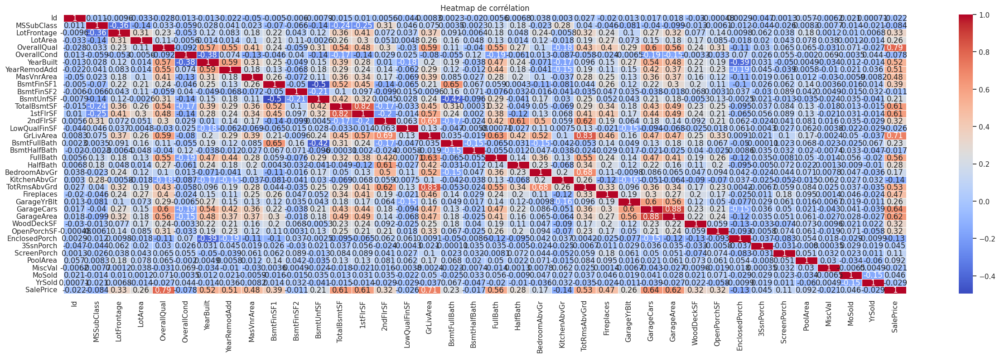

In [ ]:
create_heatmap(train)

<ipython-input-60-4be0ba43b37a>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


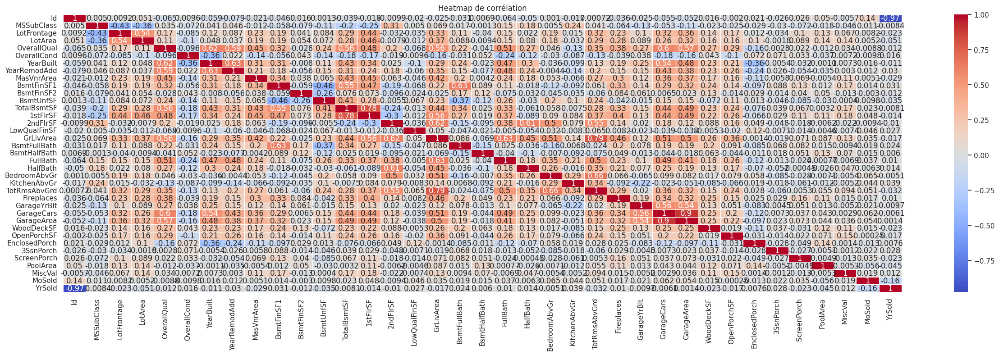

In [ ]:
create_heatmap(test)

In [ ]:
# Fonction pour la representation de distribution des features numériques

def plot_numeric_features(data):
    # Sélection des colonnes de type numérique
    numeric_columns = data.select_dtypes(include=['float', 'int']).columns

    # Parcours des colonnes numériques et tracé des distributions
    for col in numeric_columns:
        sns.displot(data[col], kde=True)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


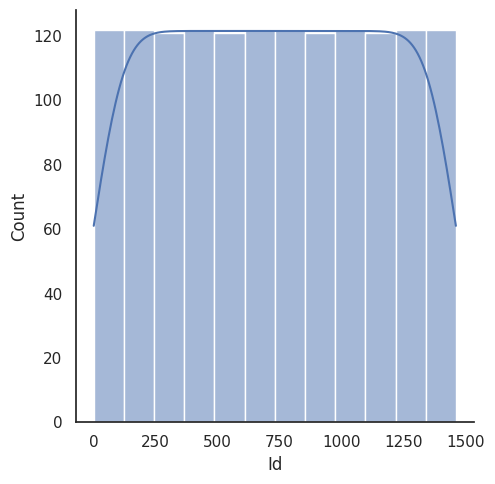

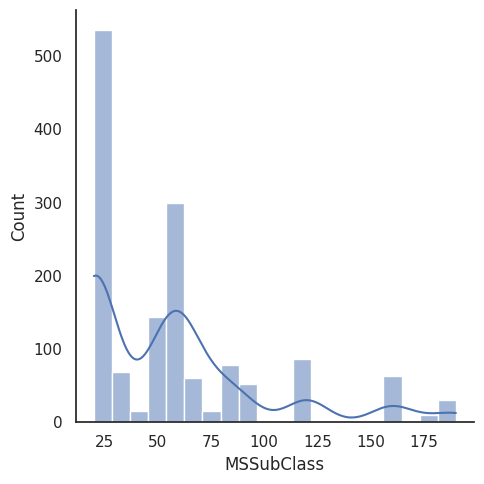

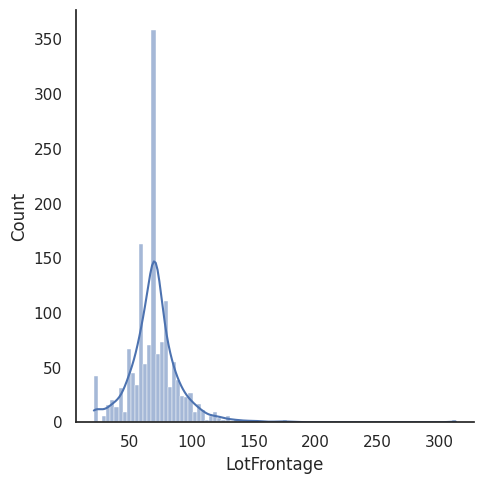

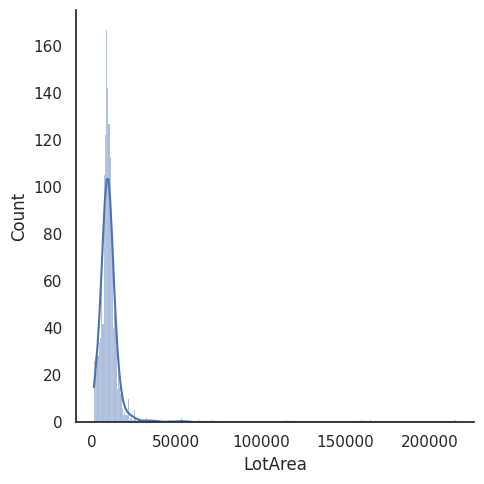

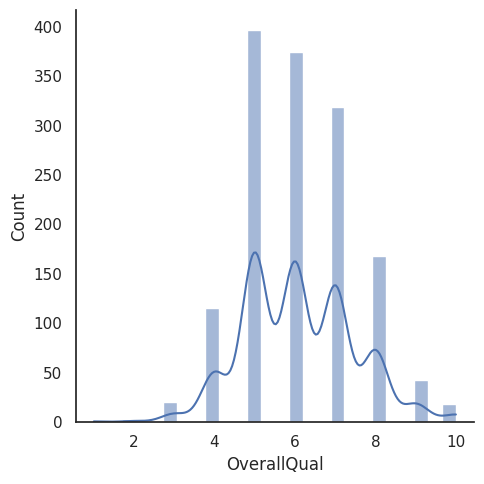

...

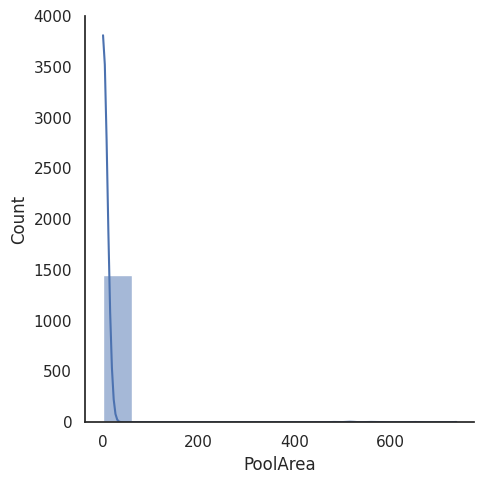

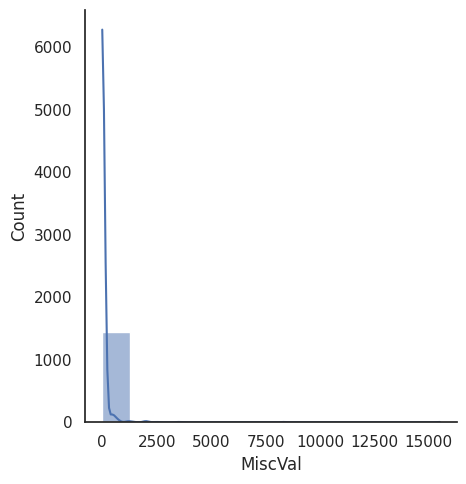

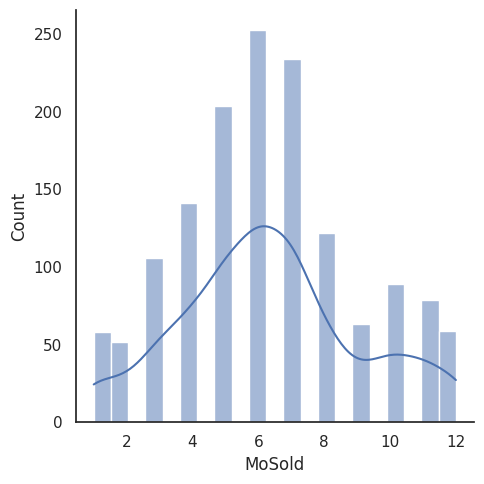

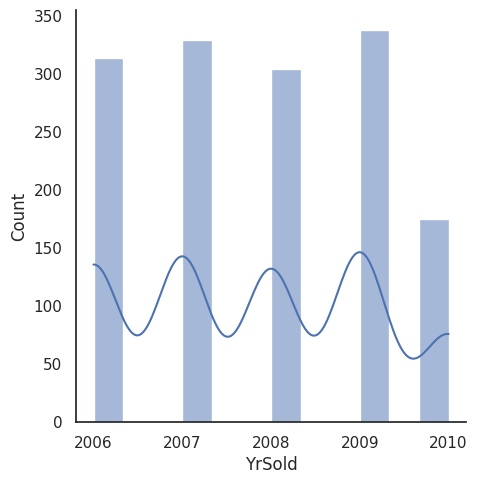

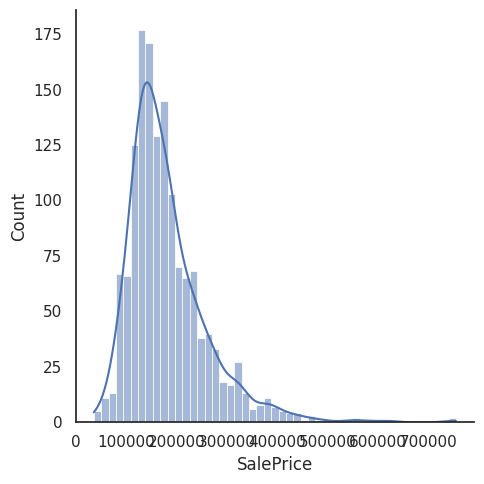

In [ ]:
plot_numeric_features(train)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


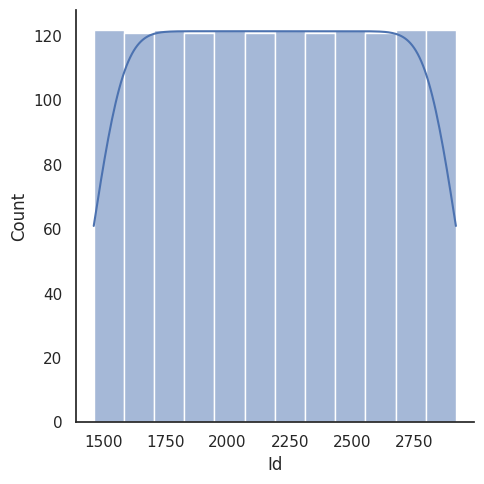

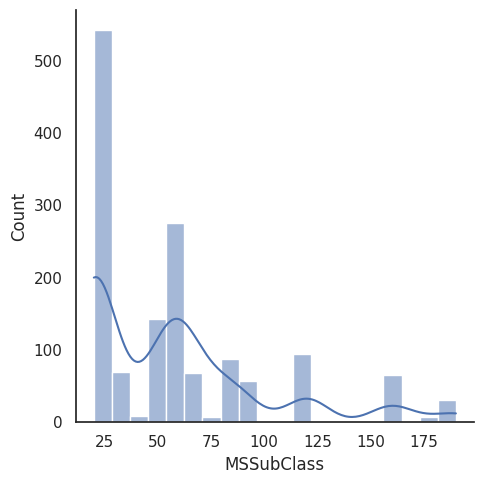

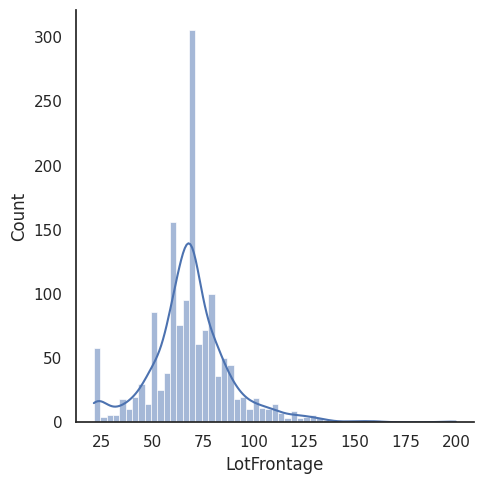

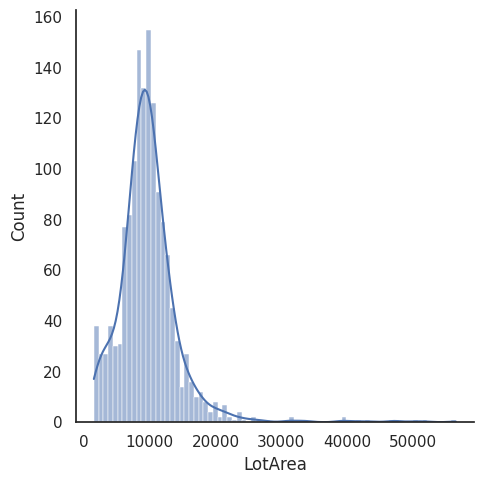

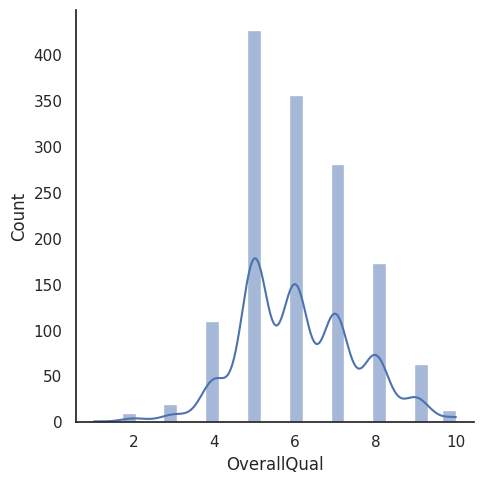

...

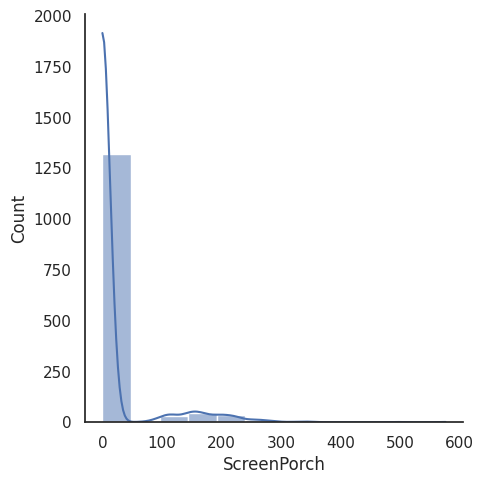

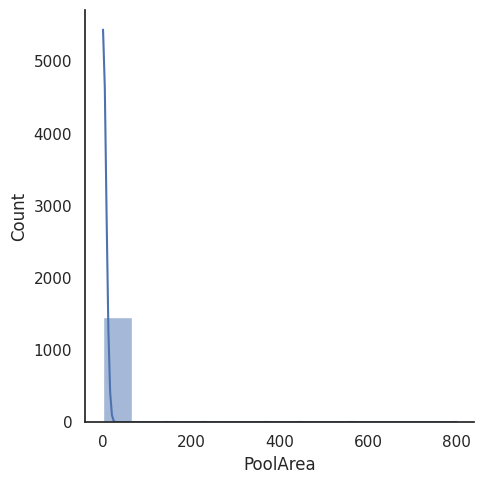

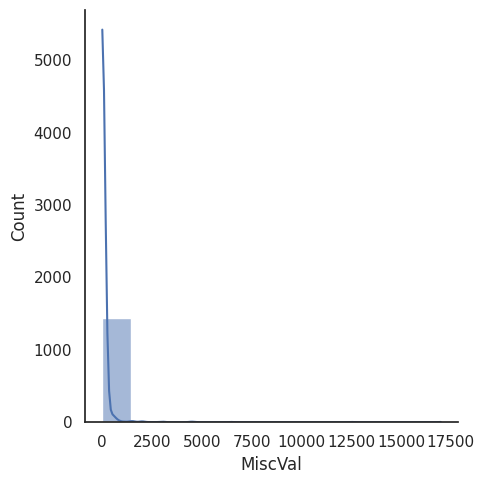

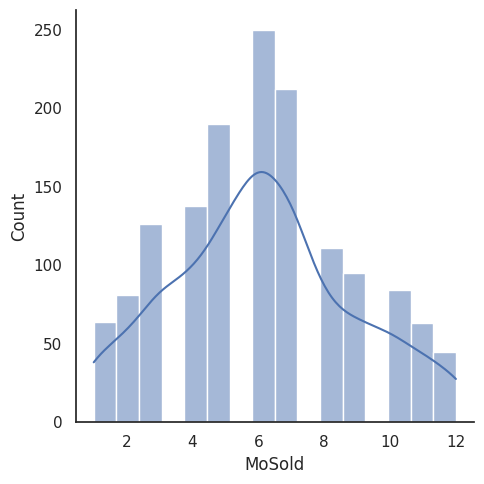

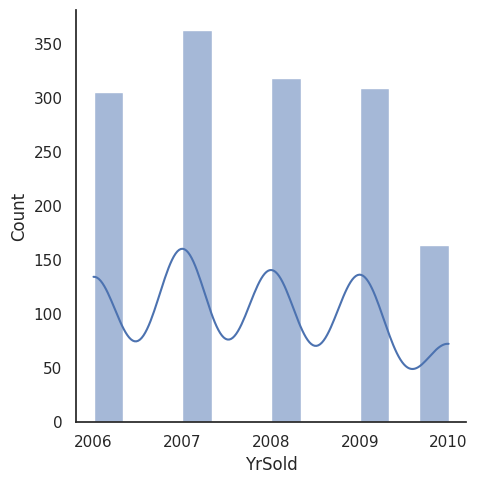

In [ ]:
plot_numeric_features(test)

In [ ]:
def plot_categorical_features(data):
    # Sélection des colonnes de type catégorique
    categorical_columns = data.select_dtypes(include=['object']).columns

    # Parcours des colonnes catégoriques et tracé des bar plots
    for col in categorical_columns:
        # Calcul des fréquences des catégories
        category_counts = data[col].value_counts()

        # Calcul des pourcentages
        percentages = category_counts / len(data) * 100

        # Tracé du bar plot avec les pourcentages
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(x=category_counts.values, y=category_counts.index, palette='pastel')
        ax.set_xlabel('Counts')
        ax.set_ylabel(col)
        ax.set_title(f'Distribution of {col}')

        # Affichage des pourcentages à droite des barres
        for i, count in enumerate(category_counts):
            percentage = percentages[i]
            ax.text(count + 10, i, f'{percentage:.1f}%', va='center')

        plt.tight_layout()
        plt.show()


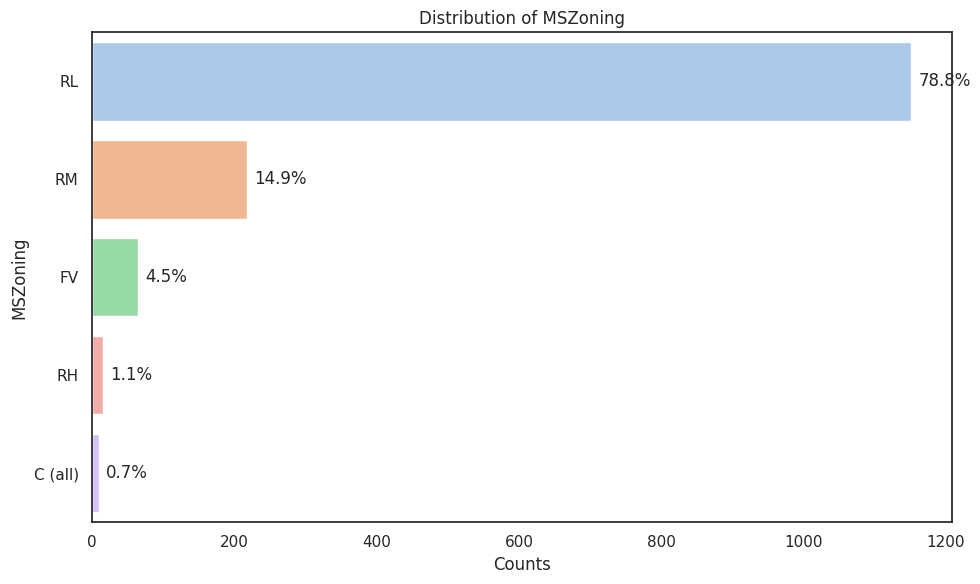

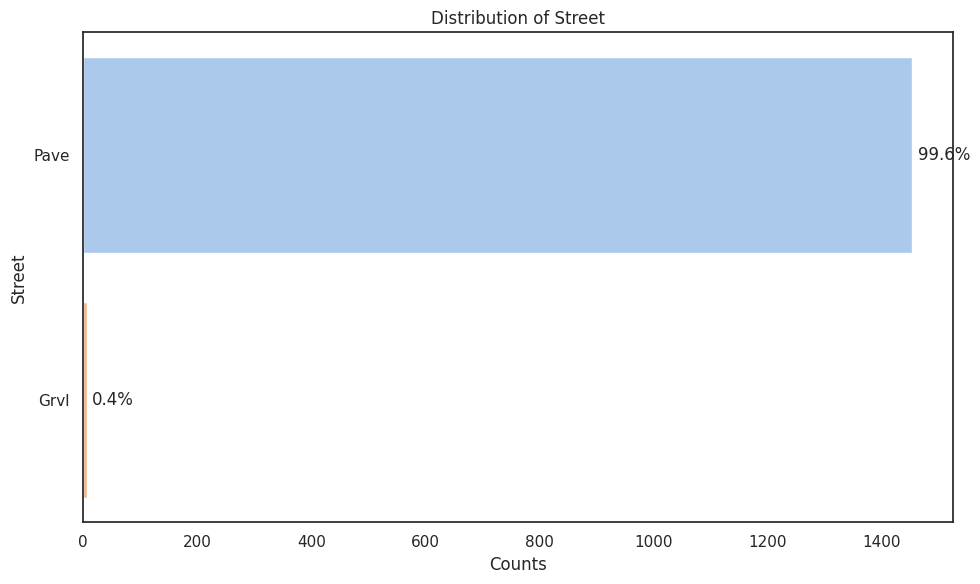

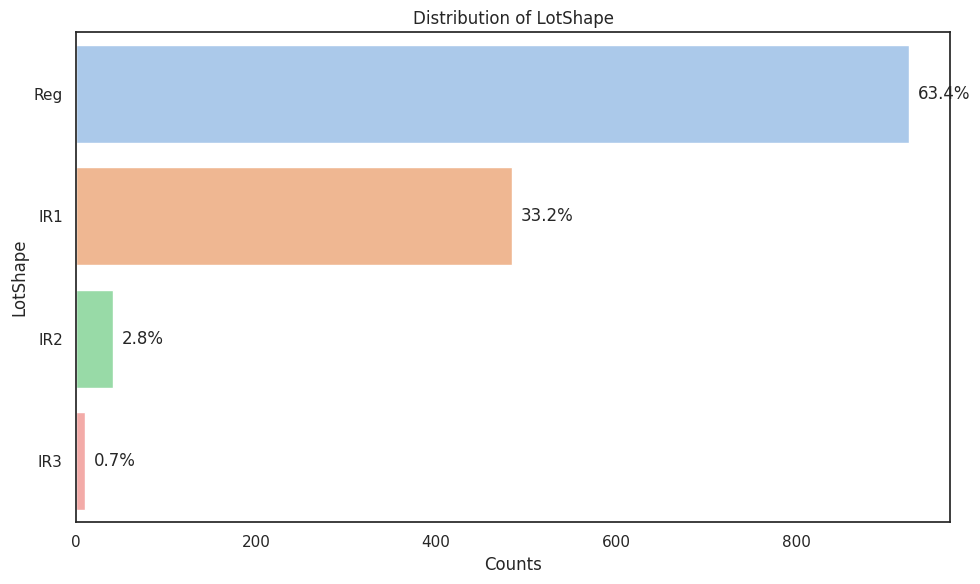

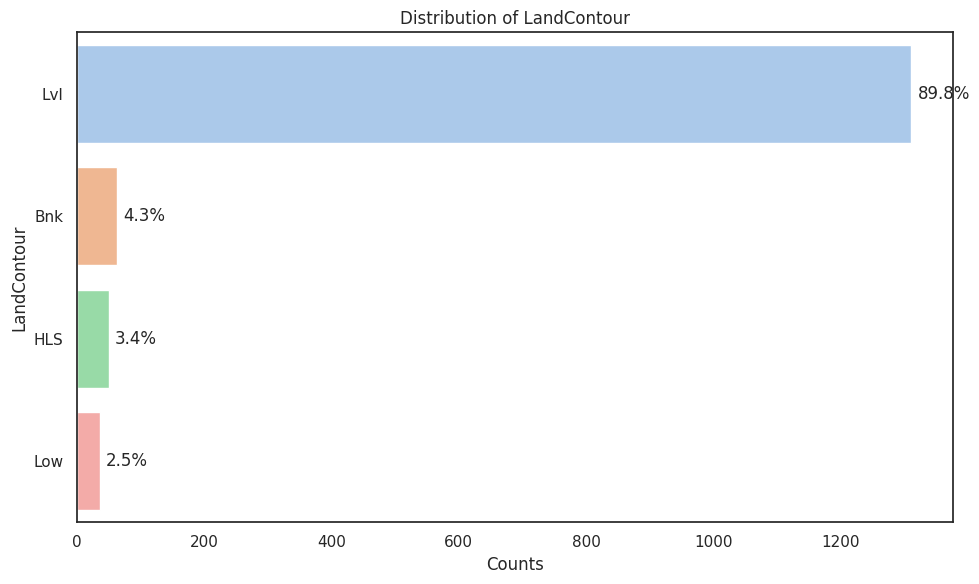

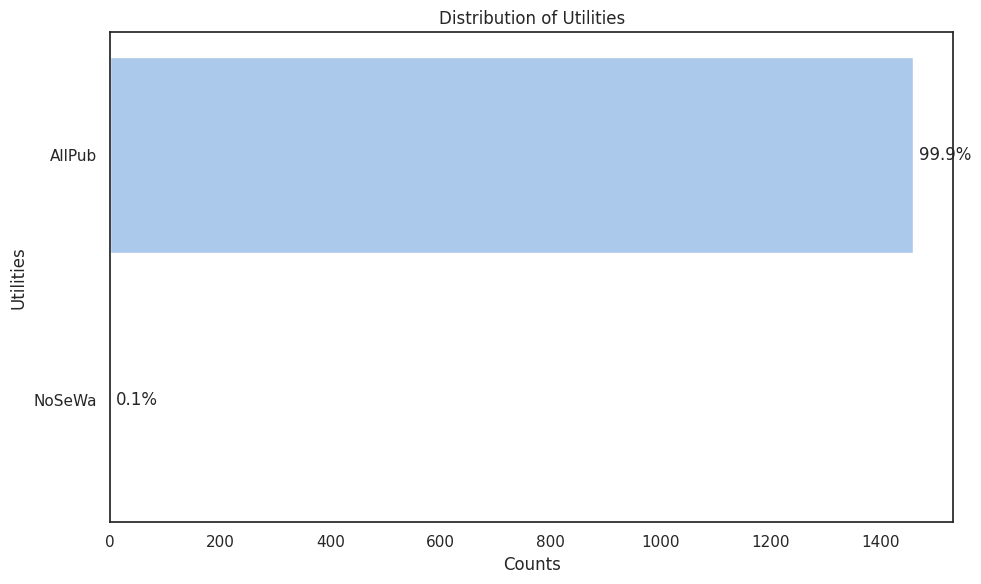

...

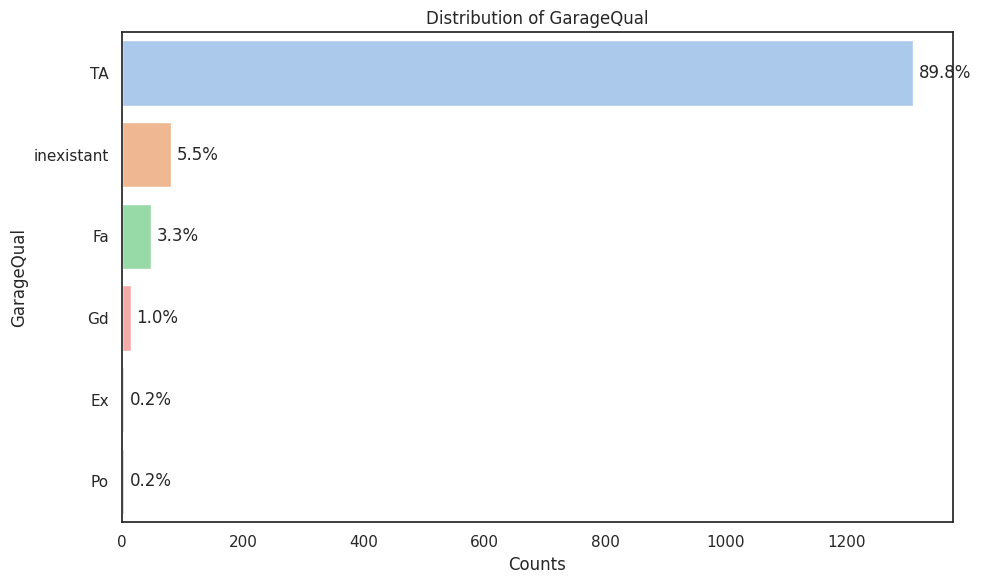

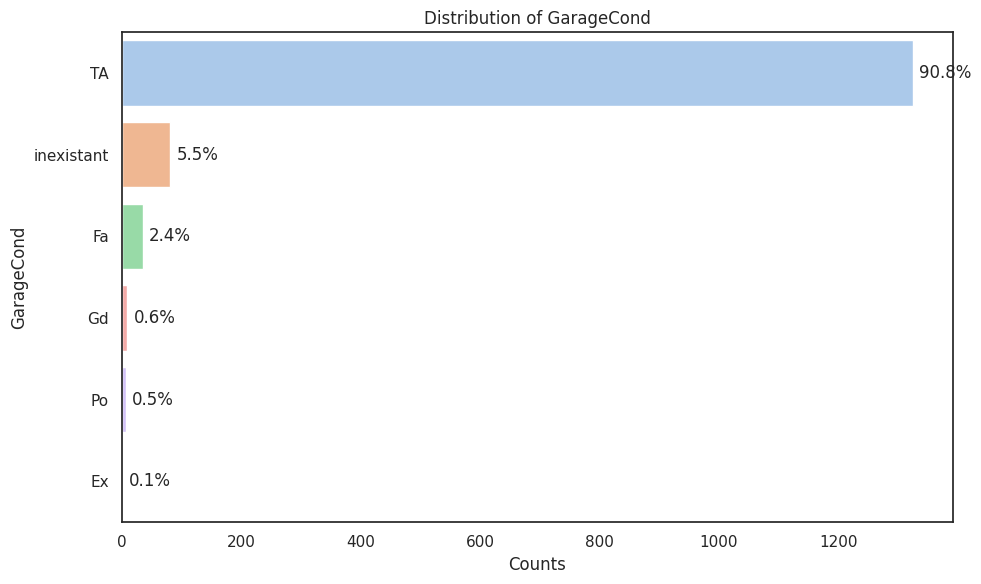

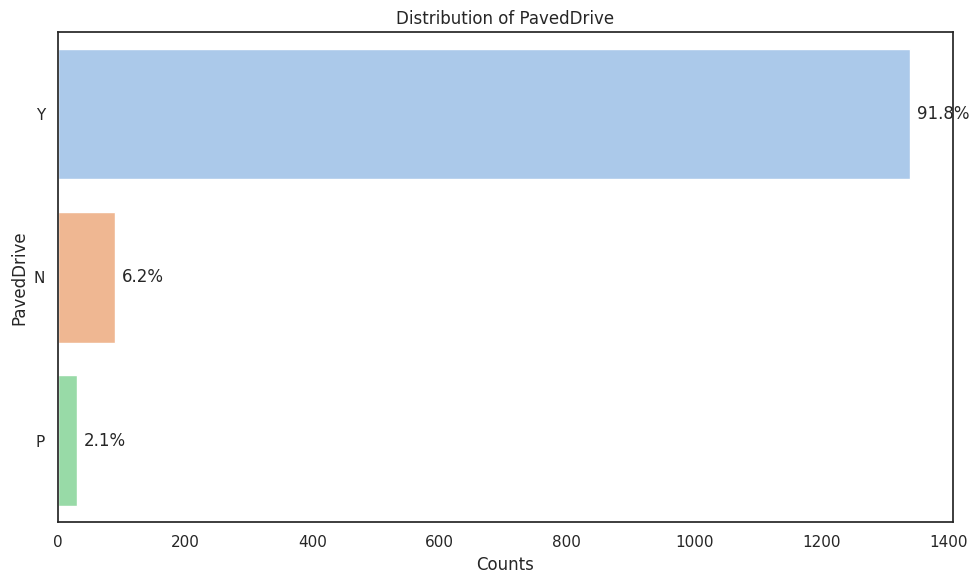

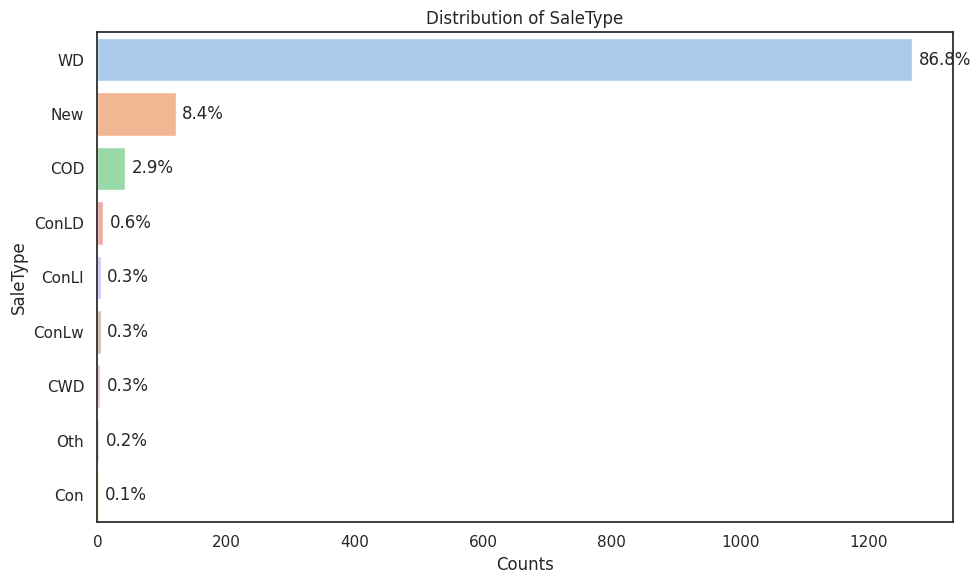

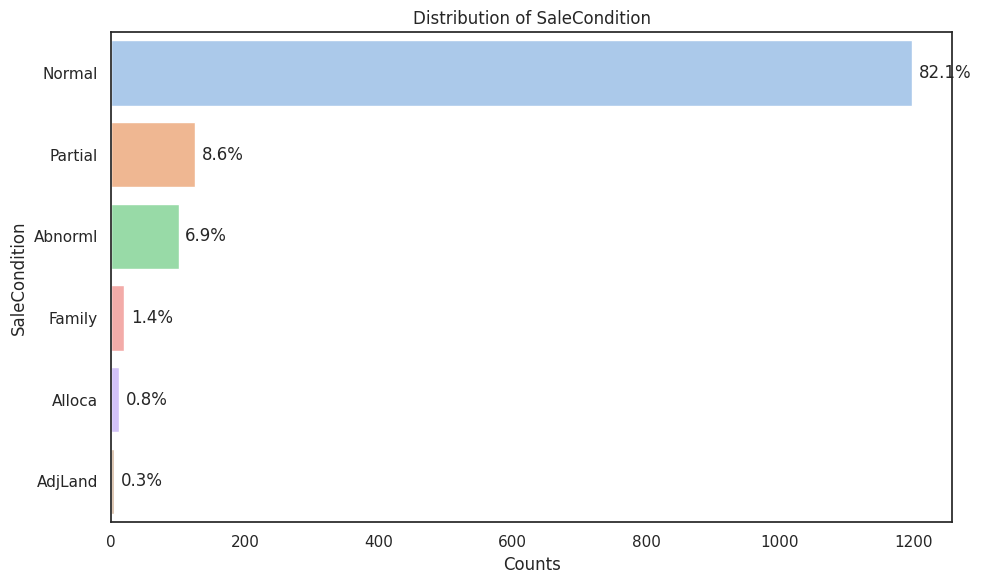

In [ ]:
plot_categorical_features(train)

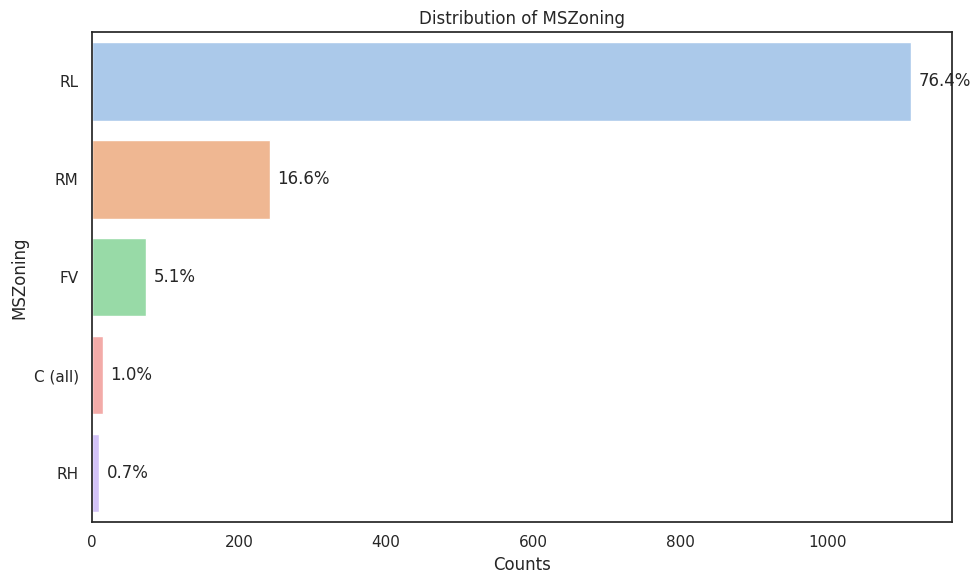

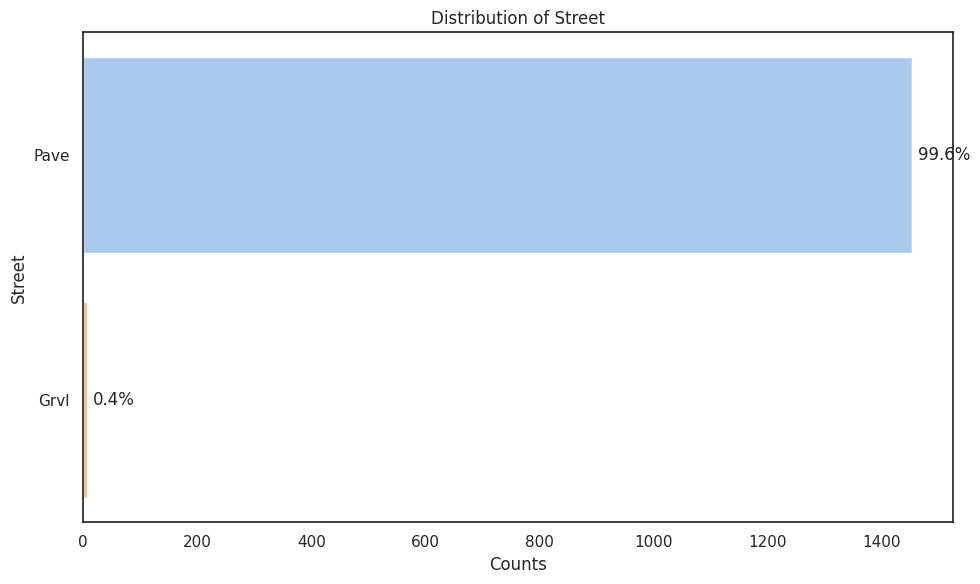

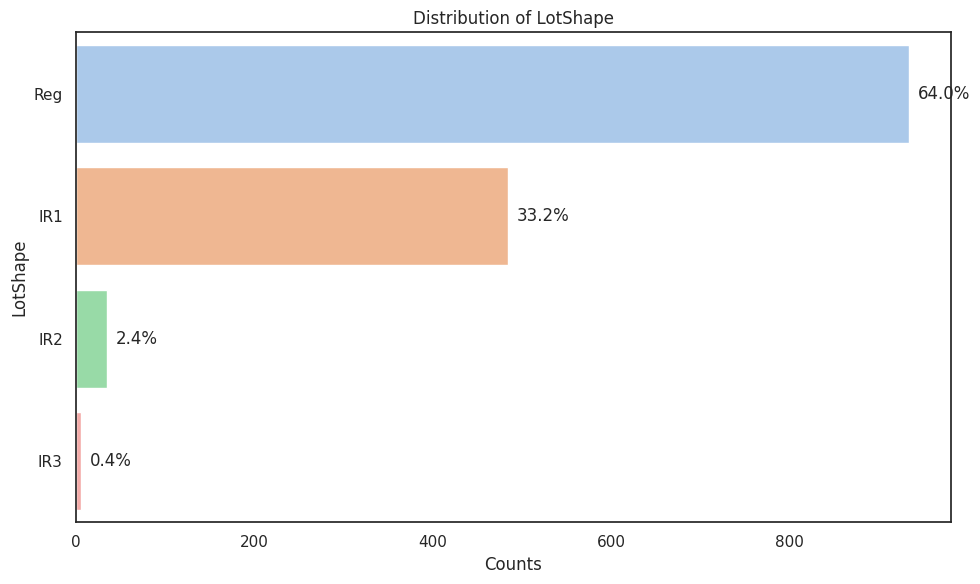

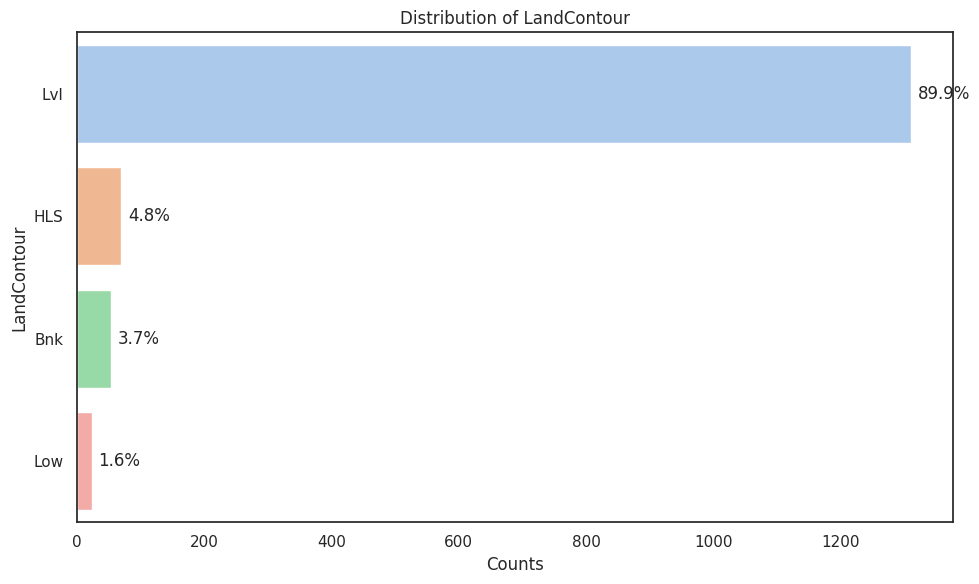

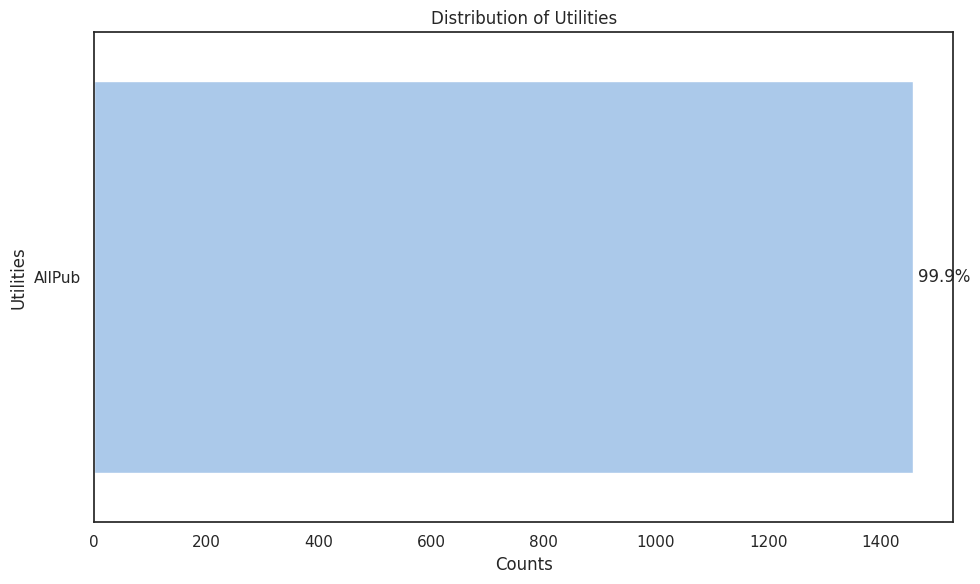

...

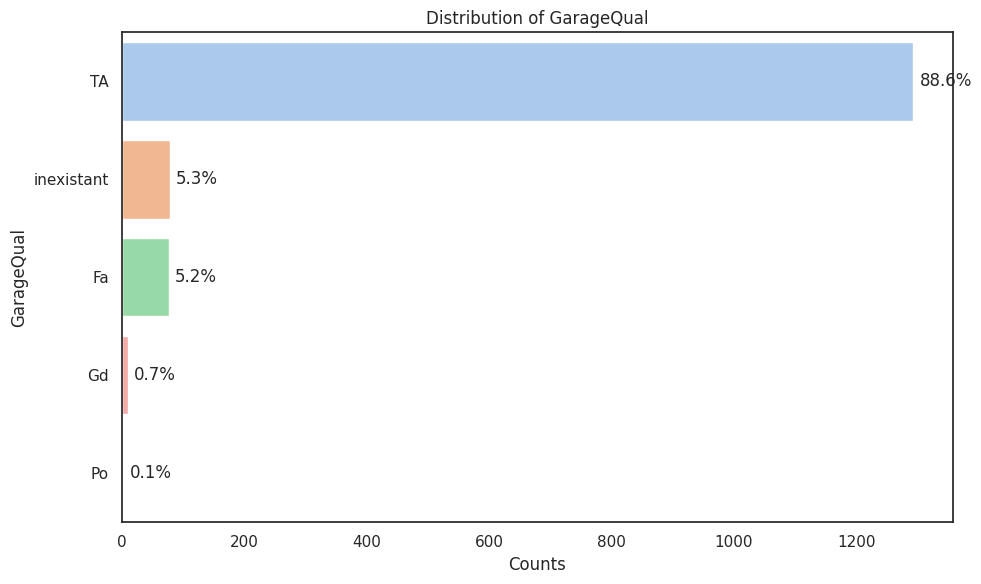

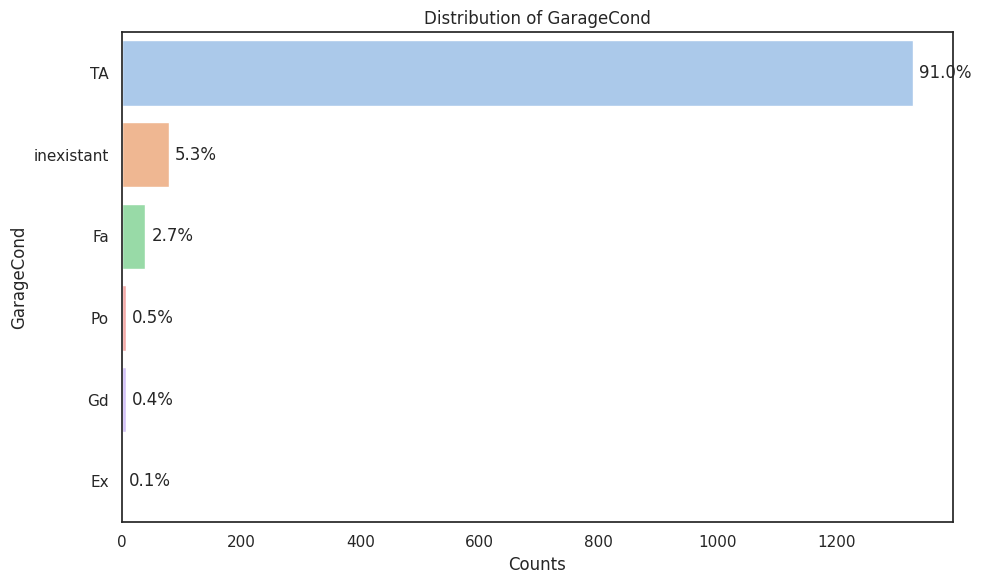

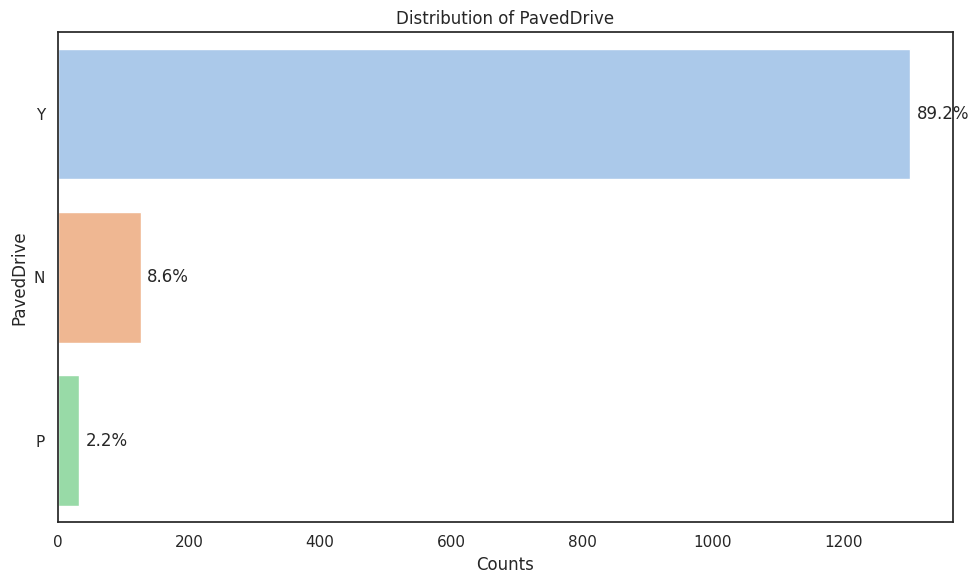

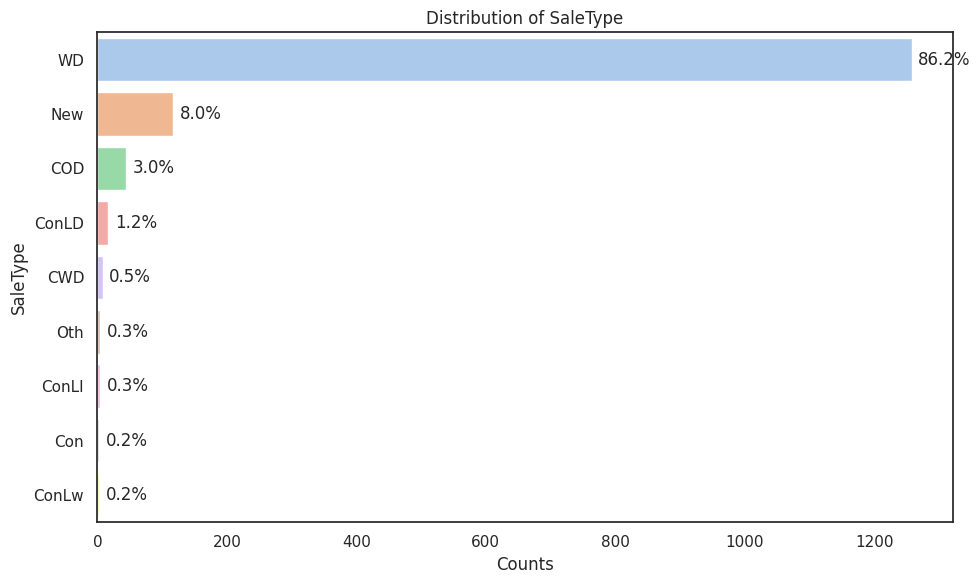

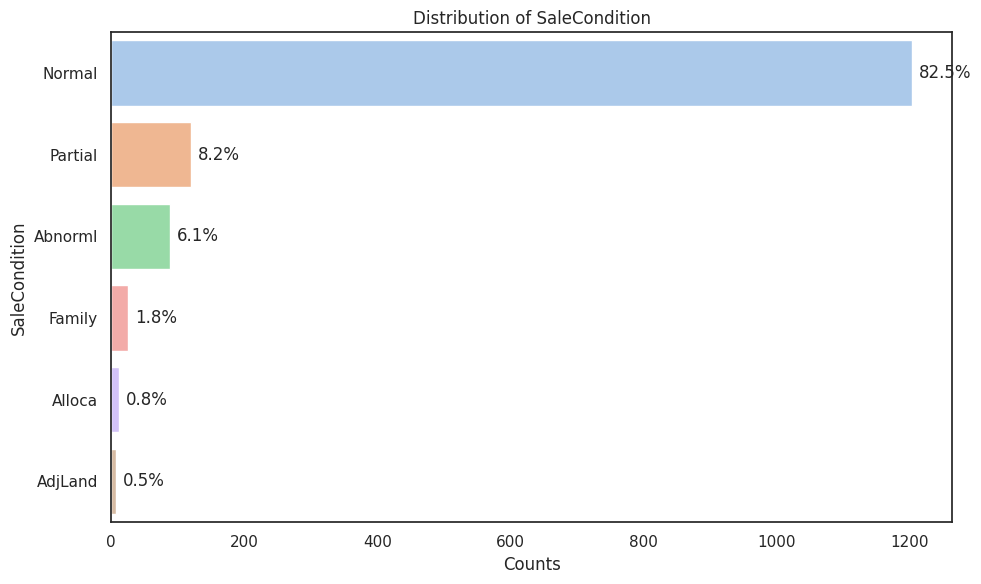

In [ ]:
plot_categorical_features(test)

# 4. Features engineering

In [ ]:
# Age du bien
def calculate_age(df):
    df['Age'] = df['YrSold'] - df['YearBuilt']
    return df

# Age de la rénovation
def calculate_renovation_age(df):
    df['RenovationAge'] = df['YrSold'] - df['YearRemodAdd']
    return df

# Surface totale
def calculate_total_area(df):
    df['TotalArea'] = df['1stFlrSF'] + df['2ndFlrSF'] + df['TotalBsmtSF']
    return df

# Total des salles de bains
def calculate_total_bathrooms(df):
    df['TotalBathrooms'] = df['FullBath'] + 0.5 * df['HalfBath']
    return df

# Qualité globale
def calculate_overall_quality(df):
    df['OverallQuality'] = df['OverallQual'] * df['OverallCond']
    return df

# Total des superficies du sous-sol
def calculate_total_bsmt_area(df):
    df['TotalBsmtArea'] = df['BsmtFinSF1'] + df['BsmtFinSF2'] + df['BsmtUnfSF']
    return df

# Présence d'une piscine
def calculate_pool_presence(df):
    df['HasPool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
    return df

# Total des superficies extérieures
def calculate_total_outdoor_area(df):
    df['TotalOutdoorArea'] = df['WoodDeckSF'] + df['OpenPorchSF'] + df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch']
    return df

# Total des caractéristiques du garage
def calculate_total_garage_features(df):
    df['TotalGarageFeatures'] = df['GarageCars'] + df['GarageArea']
    return df

# Total des caractéristiques du jardin
def calculate_total_garden_features(df):
    df['TotalGardenFeatures'] = df['3SsnPorch'] + df['ScreenPorch']
    return df

# Appliquer toutes les fonctions de features engineering
def apply_feature_engineering(df):
    df = calculate_age(df)
    df = calculate_renovation_age(df)
    df = calculate_total_area(df)
    df = calculate_total_bathrooms(df)
    df = calculate_overall_quality(df)
    df = calculate_total_bsmt_area(df)
    df = calculate_pool_presence(df)
    df = calculate_total_outdoor_area(df)
    df = calculate_total_garage_features(df)
    df = calculate_total_garden_features(df)

    return df[[ 'Id','Age', 'RenovationAge', 'TotalArea', 'TotalBathrooms', 'OverallQuality',
               'TotalBsmtArea', 'HasPool', 'TotalOutdoorArea', 'TotalGarageFeatures',
               'TotalGardenFeatures']]


In [ ]:
test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

In [ ]:
train_features = apply_feature_engineering(train)

In [ ]:

# Ajouter la colonne "SalePrice" à train_features
train_features['SalePrice'] = train['SalePrice']

# Afficher le DataFrame train_features avec la colonne "SalePrice"
train_features


<ipython-input-74-dd0f049d2b7d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_features['SalePrice'] = train['SalePrice']


,Id,Age,RenovationAge,TotalArea,TotalBathrooms,OverallQuality,TotalBsmtArea,HasPool,TotalOutdoorArea,TotalGarageFeatures,TotalGardenFeatures,SalePrice
0,1,5,5,2566,2.5,35,856,0,61,550,0,208500
1,2,31,31,2524,2.0,48,1262,0,298,462,0,181500
2,3,7,6,2706,2.5,35,920,0,42,610,0,223500
3,4,91,36,2473,1.0,35,756,0,307,645,0,140000
4,5,8,8,3343,2.5,40,1145,0,276,839,0,250000
5,6,16,14,2158,1.5,25,796,0,390,482,320,143000
6,7,3,2,3380,2.0,40,1686,0,312,638,0,307000
7,8,36,36,3197,2.5,42,1107,0,667,486,0,200000
8,9,77,58,2726,2.0,35,952,0,295,470,0,129900
9,10,69,58,2068,1.0,30,991,0,4,206,0,118000


count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


<ipython-input-75-c4be738ac363>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_features['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});


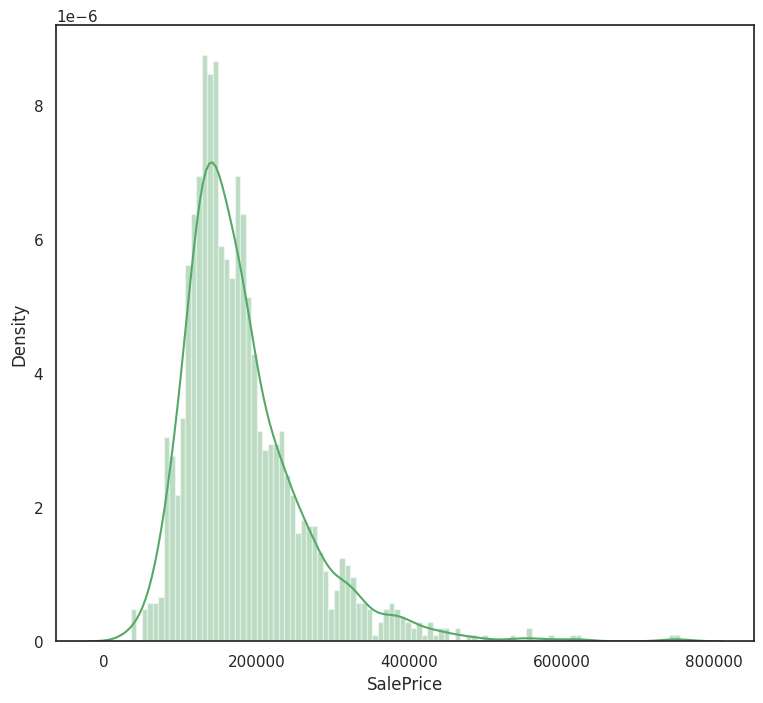

In [ ]:
print(train_features['SalePrice'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(train_features['SalePrice'], color='g', bins=100, hist_kws={'alpha': 0.4});

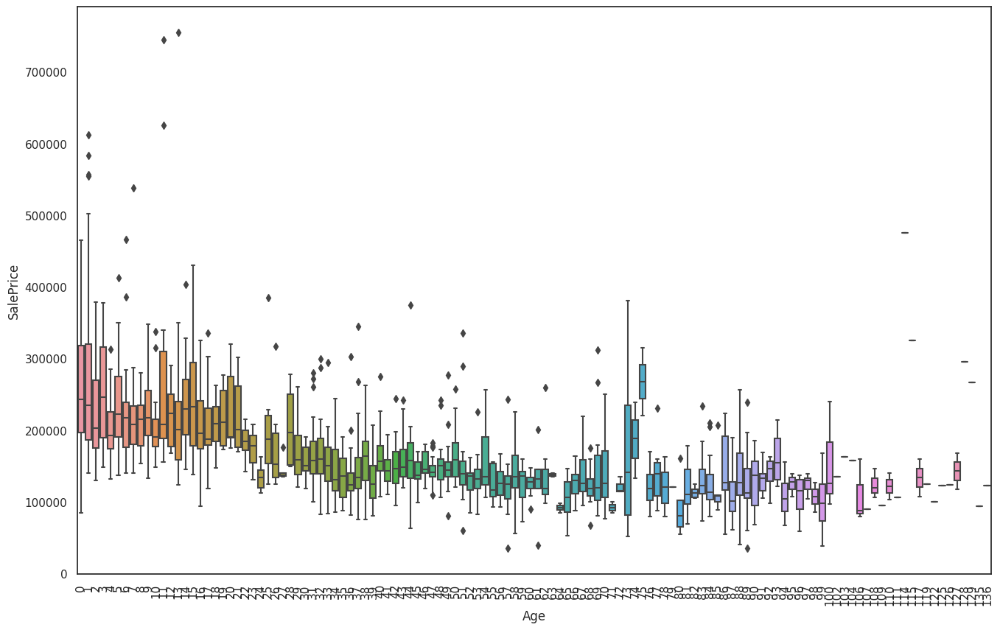

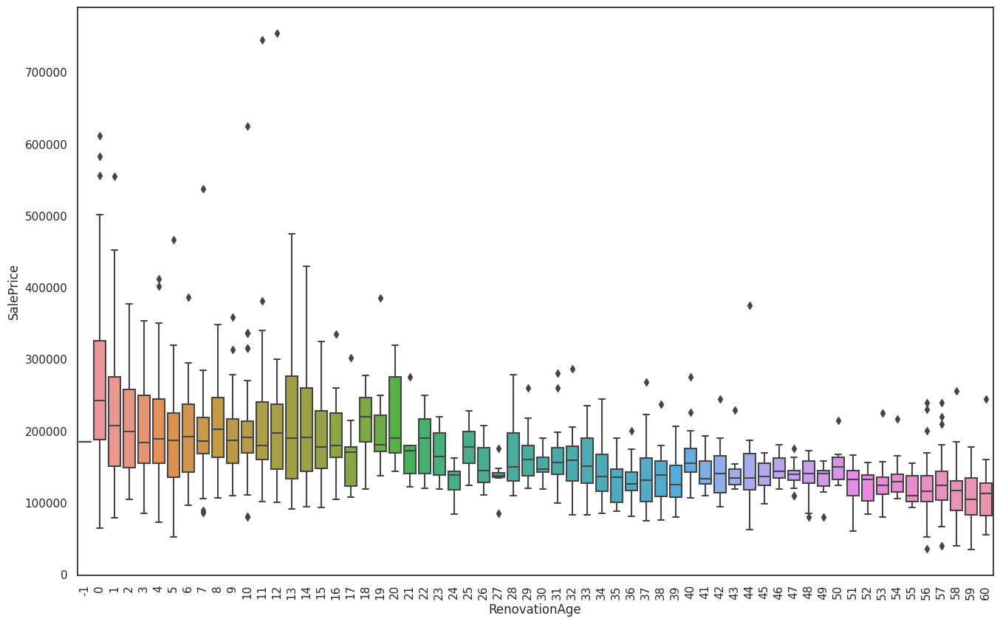

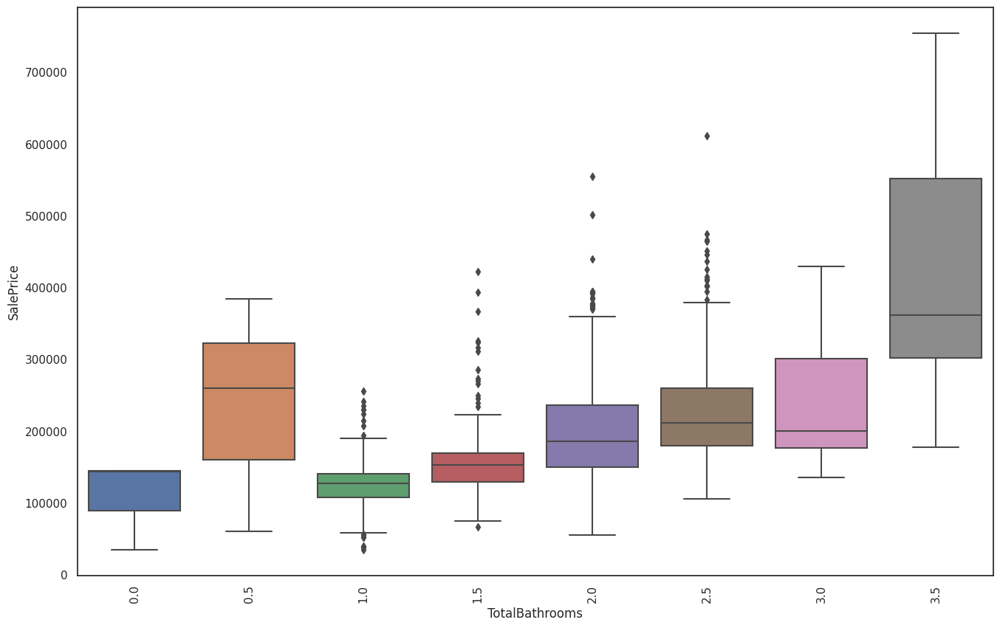

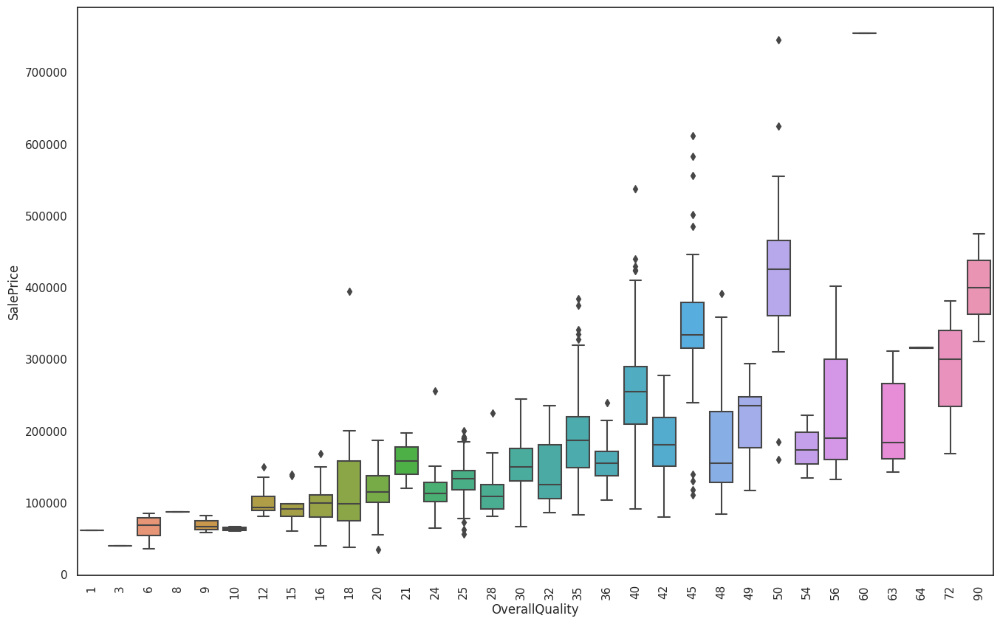

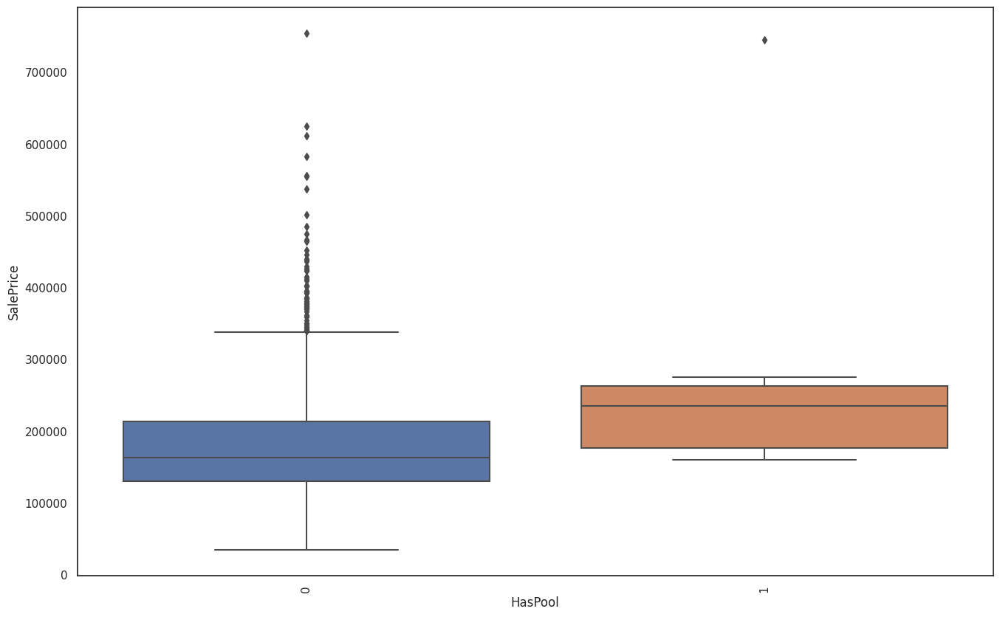

In [ ]:
features = ['Age', 'RenovationAge', 'TotalBathrooms', 'OverallQuality', 'HasPool']

for feature in features:
    data = pd.concat([train_features['SalePrice'], train_features[feature]], axis=1)
    f, ax = plt.subplots(figsize=(16, 10))
    plt.xticks(rotation=90)
    sns.boxplot(x=feature, y='SalePrice', data=data)
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.show()

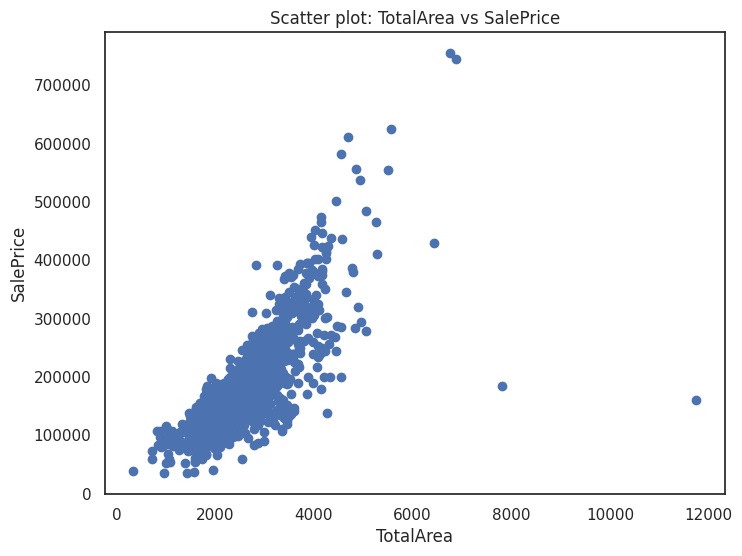

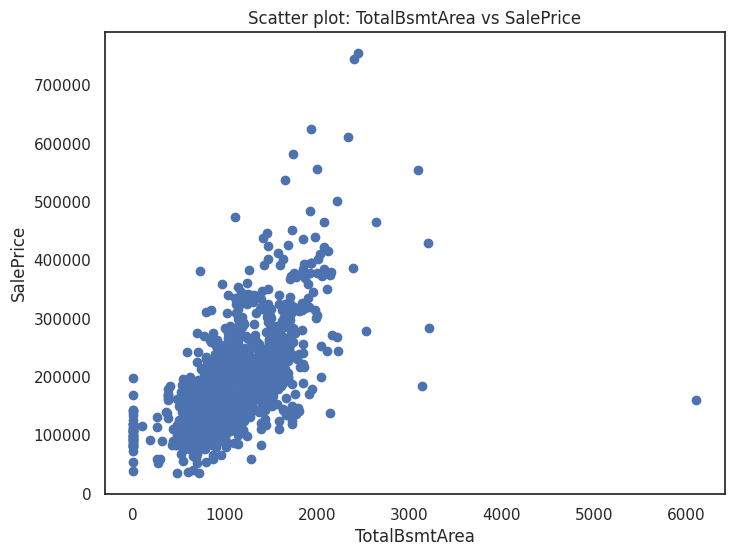

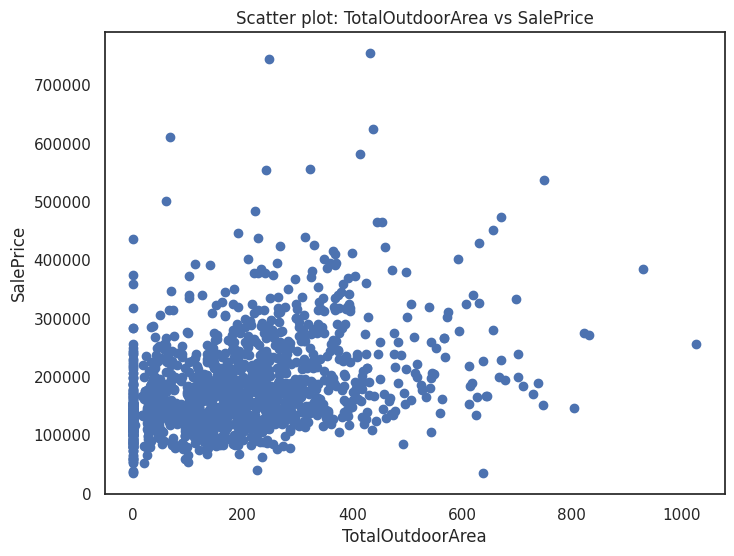

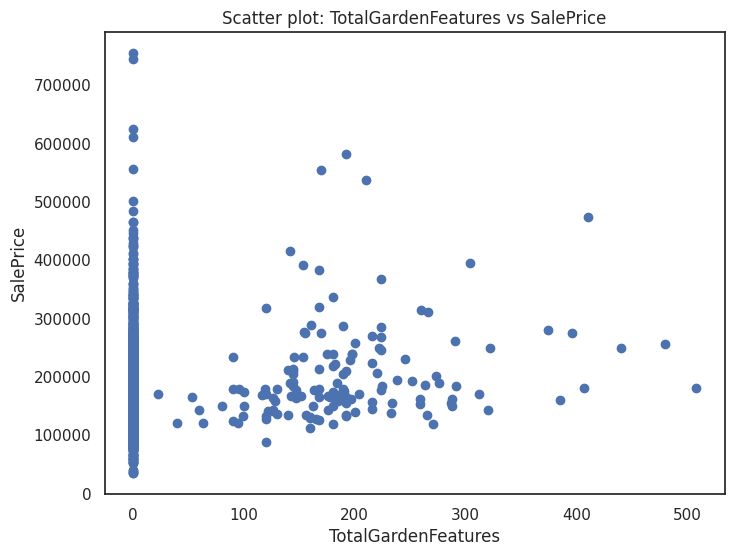

In [ ]:
features = ['TotalArea', 'TotalBsmtArea', 'TotalOutdoorArea', 'TotalGardenFeatures']

for feature in features:
    plt.figure(figsize=(8, 6))
    plt.scatter(train_features[feature], train_features['SalePrice'])
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.title(f'Scatter plot: {feature} vs SalePrice')
    plt.show()


<ipython-input-78-8aea9a615bbd>:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(matrix, dtype=np.bool))


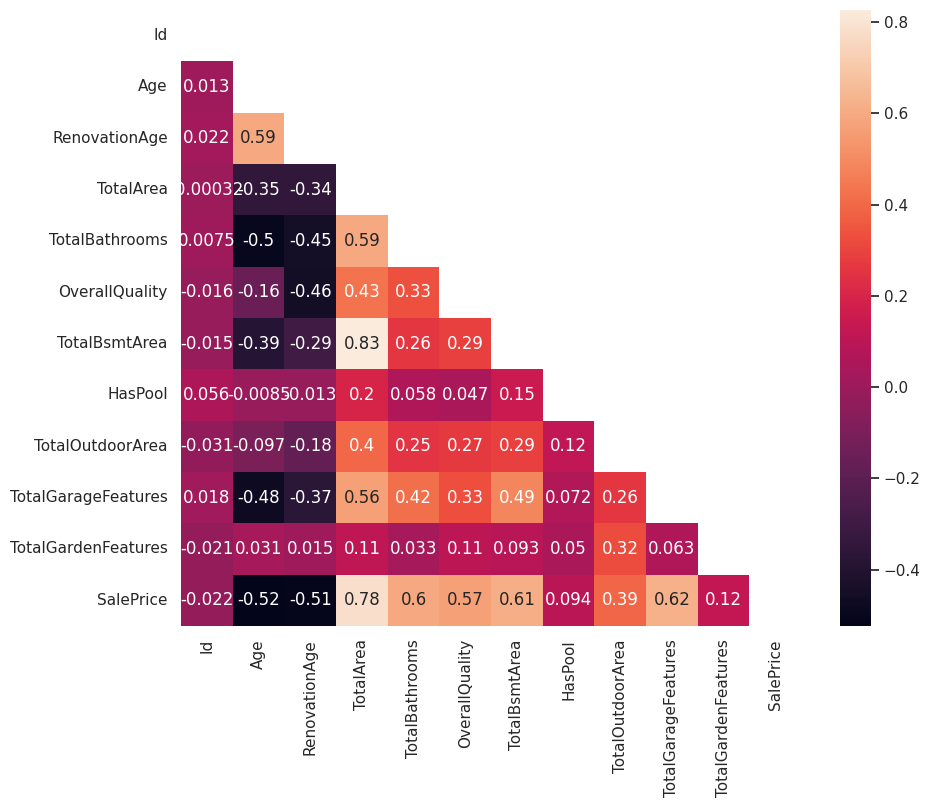

In [ ]:
# Calculate pairwise-correlation
matrix = train_features.corr()

# Triangle de corrélations
mask = np.triu(np.ones_like(matrix, dtype=np.bool))
plt.figure(figsize=(10,8))
sns.heatmap(matrix, mask=mask, annot=True)

plt.show()

In [ ]:
# Observation des variables avec de fortes correlations
corr_min = 0.7
corr_pairs = matrix.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > corr_min)])
               .reset_index().rename(columns={0:'coef_correl'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('coef_correl', ascending=False).head(15)

,level_0,level_1,coef_correl
2,TotalBsmtArea,TotalArea,0.826742
0,TotalArea,SalePrice,0.782260


Cette corrélation élevée indique que les deux variables sont fortement liées, ce qui signifie que la surface totale du sous-sol ('TotalBsmtArea') est fortement associée à la surface totale globale de la maison ('TotalArea'). Les deux variables fortement corrélées peut entraîner une redondance d'informations, ce qui peut affecter négativement les performances du modèle d'apprentissage automatique. C'est pour cela que nous decidons de supprimer 'TotalBsmtArea'.

In [ ]:
train_features = train_features.drop('TotalBsmtArea', axis=1)

In [ ]:
# fonction pour tracer lrs graphe
def histplot_boxplot(
        dataframe,
        variable,
        titre,
        kde=True,
        mean_median=True):
    """
    Histplot pour les variables quantitatives général +boxplot
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                variable : colonne dont on veut voir les histplot
                titre : titre du graphique (str)
                kde : boolean pour tracer la distribution normale
                mean_median_mode : boolean pour tracer la moyenne, médiane et mode
    @param OUT :None
    """
    #histplot
    fig = plt.figure(figsize=(15, 6))

    data = dataframe[variable]
    ax1 = fig.add_subplot(1, 2, 1)
    ax1 = sns.histplot(data, kde=kde, color='SteelBlue')
    if mean_median:
        ax1.vlines(data.mean(), *ax1.get_ylim(), color='red', ls='-', lw=1.5)
        ax1.vlines(
            data.median(),
            *ax1.get_ylim(),
            color='green',
            ls='-.',
            lw=1.5)
        #ax1.vlines(
            #data.mode()[0],
            #*ax1.get_ylim(),
            #color='goldenrod',
            #ls='--',
            #lw=1.5)
    ax1.legend([ 'mode','mean', 'median'])
    ax1.set_ylabel('Nombre', fontsize=12)
    ax1.set_title(titre, fontsize=14)
    plt.grid(False)

     #boxplot

    ax2 = fig.add_subplot(1, 2, 2)
    box = sns.boxplot(dataframe[variable], color='SteelBlue', ax=ax2)

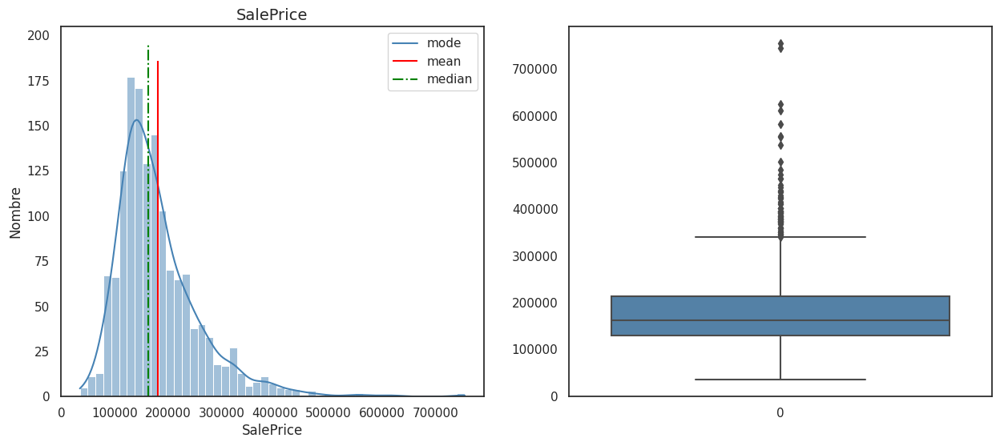

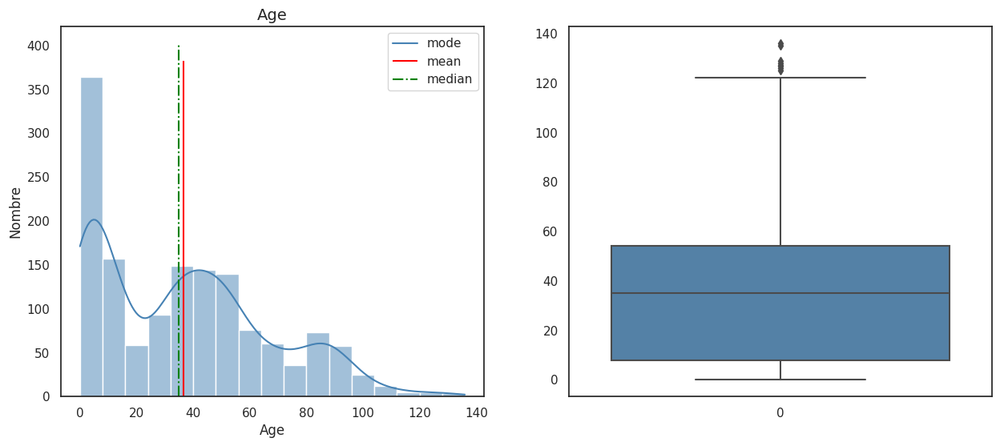

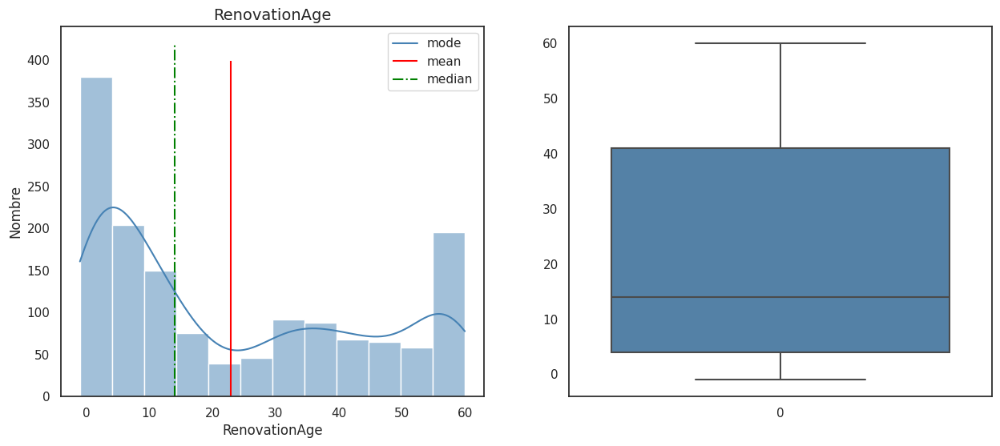

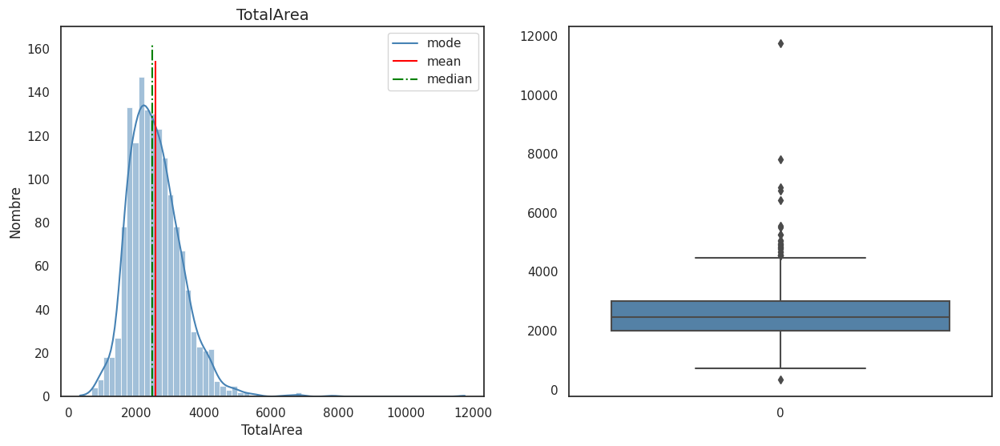

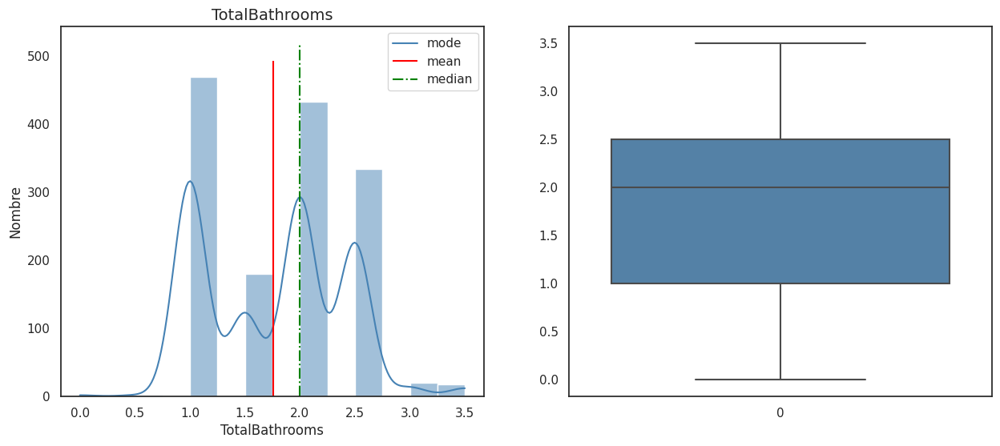

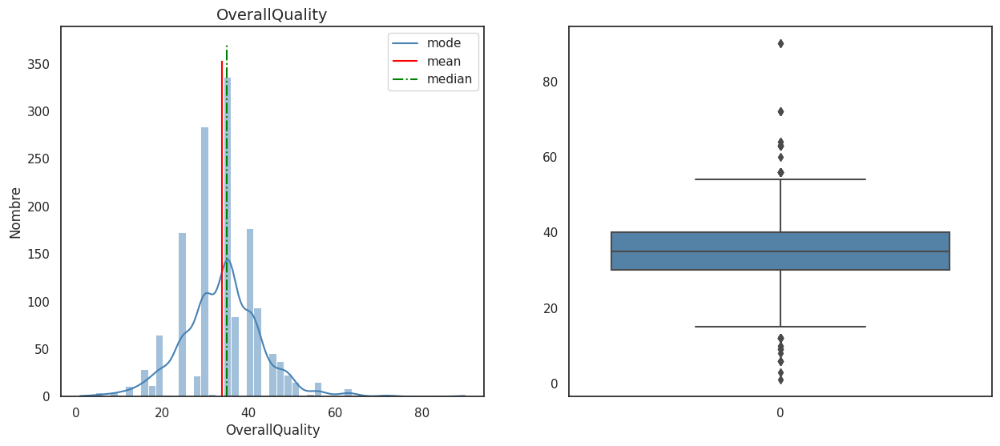

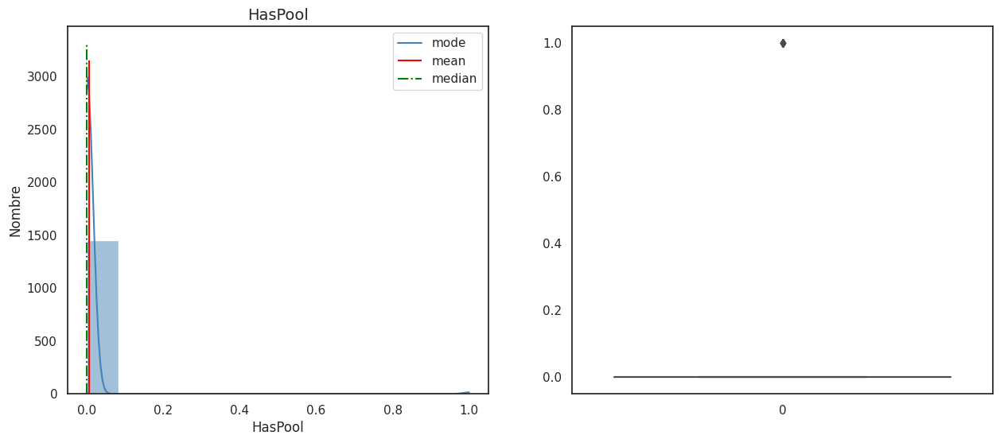

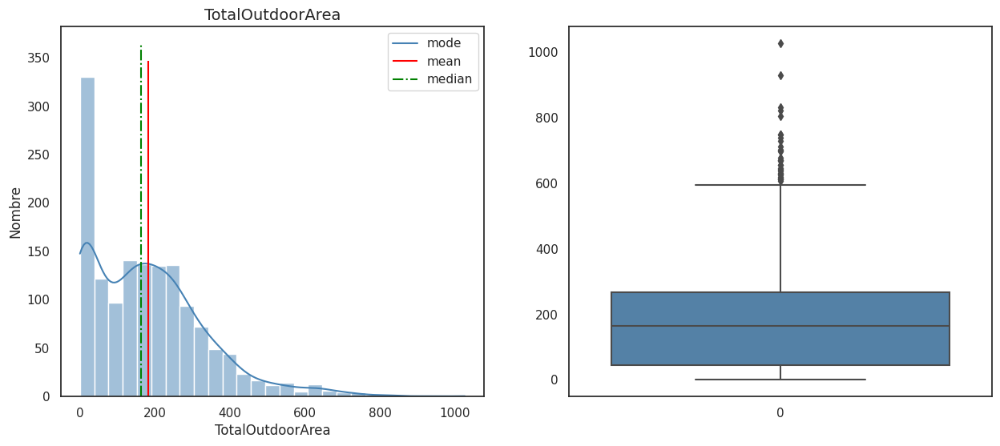

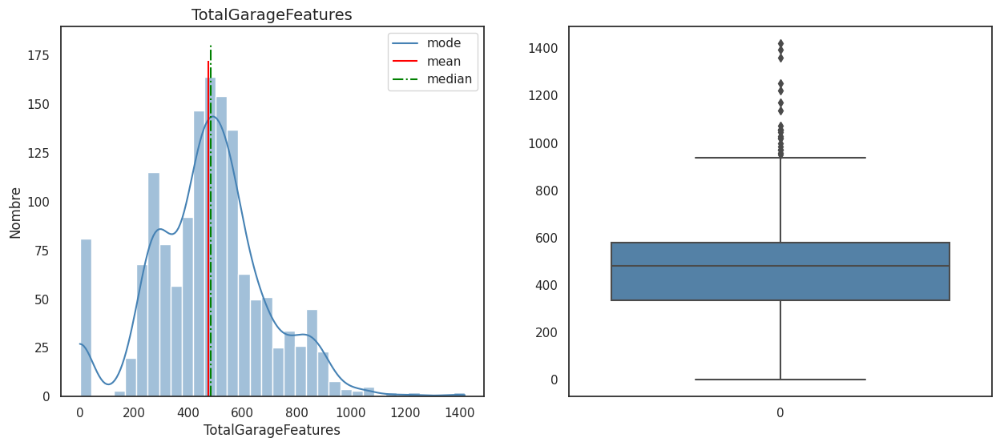

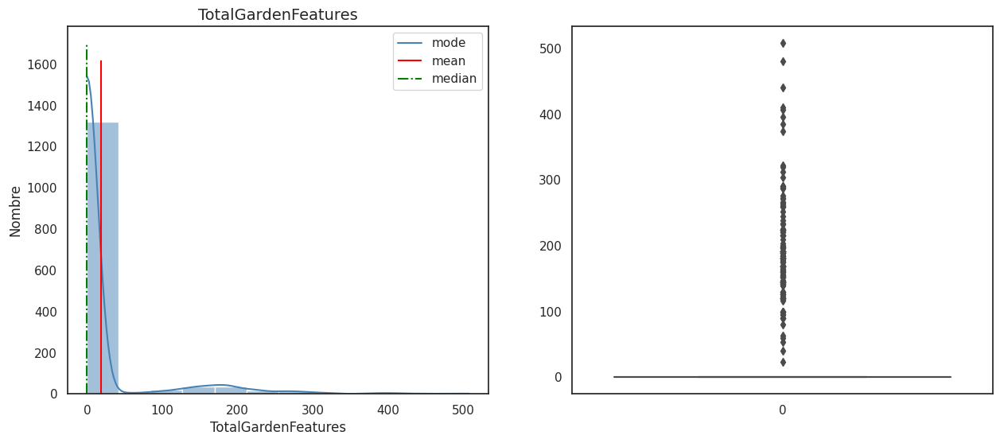

In [ ]:
features = ['SalePrice','Age', 'RenovationAge', 'TotalArea', 'TotalBathrooms', 'OverallQuality', 'HasPool', 'TotalOutdoorArea', 'TotalGarageFeatures', 'TotalGardenFeatures']

for feature in features:
    histplot_boxplot(train_features, feature, feature)


Ici nous remarquons que nombreuses de nos variables quantitatives ont une forte asymétrie à droite (skewed > 1). Le passage au log a pour objectif principal d'aider les algorithmes de machine learning à travailler de manière plus précise et efficace en transformant les variables explicatives et cible de manière objective. Cette transformation consiste à se rapprocher le plus possible d'une distribution normale.



In [ ]:
def switch_log(df, columns):
    for column in columns:
        col_name = str(column + '_log')
        shift = 1 - df[column].min()
        df[col_name] = np.log(df[column] + shift)

In [ ]:
switch_log(train_features, ['SalePrice', 'TotalArea'])

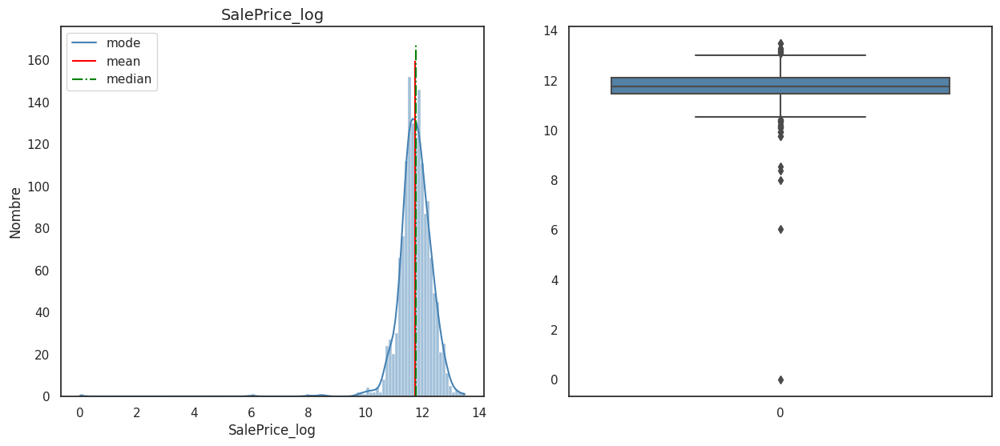

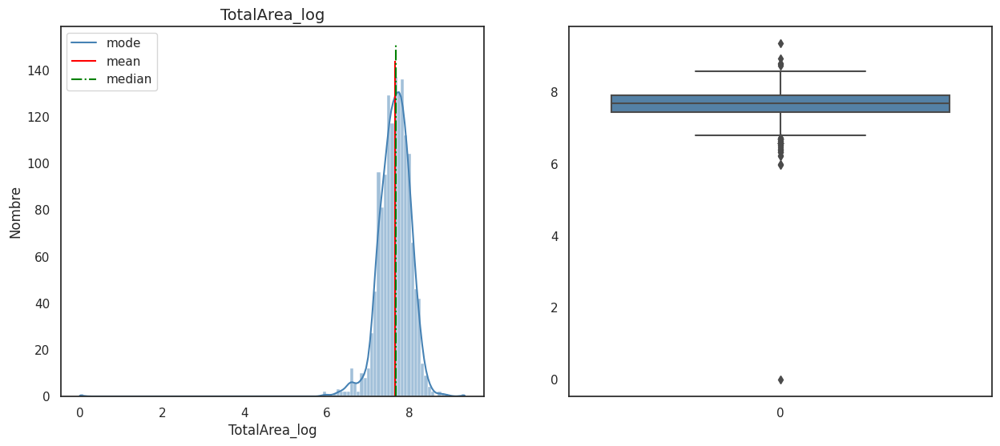

In [ ]:
features = ['SalePrice_log','TotalArea_log']

for feature in features:
    histplot_boxplot(train_features, feature, feature)

In [ ]:
columns_to_drop = ['TotalArea', 'SalePrice', 'TotalBathrooms_log']
train_features.drop(columns_to_drop, axis=1, inplace=True)


In [ ]:
from scipy.stats import levene

def test_homoscedasticity(df):
    features = df.columns.tolist()
    for feature in features:
        stat, p = levene(df[feature], df['SalePrice_log'])
        print(f"Feature: {feature}")
        print(f"Levene's test statistic: {stat}")
        print(f"p-value: {p}")
        print("-" * 50)

# Appel de la fonction pour tester l'homoscédasticité des features
test_homoscedasticity(train_features)


Feature: Id
Levene's test statistic: 4367.145197189062
p-value: 0.0
--------------------------------------------------
Feature: Age
Levene's test statistic: 3078.7155003928474
p-value: 0.0
--------------------------------------------------
Feature: RenovationAge
Levene's test statistic: 2354.3410189944875
p-value: 0.0
--------------------------------------------------
Feature: TotalBathrooms
Levene's test statistic: 57.28505726642735
p-value: 5.024203872098463e-14
--------------------------------------------------
Feature: OverallQuality
Levene's test statistic: 1365.384682854248
p-value: 1.582685992805352e-245
--------------------------------------------------
Feature: HasPool
Levene's test statistic: 1025.0516101937665
p-value: 5.027526410999246e-193
--------------------------------------------------
Feature: TotalOutdoorArea
Levene's test statistic: 2137.084123032138
p-value: 0.0
--------------------------------------------------
Feature: TotalGarageFeatures
Levene's test statistic:

Ces résultats indiquent que pour la plupart des features, la valeur p est très faible, ce qui suggère une inégalité des variances entre les groupes. Cependant, pour les features "SalePrice_log" et "TotalArea_log", la valeur p est égale à 1.0, ce qui signifie que les variances sont homogènes pour ces features. "SalePrice_log" est la variable cible que nous souhaitons prédire, l'hétéroscédasticité (inégalité des variances) n'aura pas d'impact direct sur la modélisation en machine learning. Les modèles de régression sont généralement robustes à l'hétéroscédasticité de la variable cible.

In [ ]:
# Appliquer l'ingénierie des caractéristiques sur le dataframe de test
test_features = apply_feature_engineering(test)

# Effectuer la transformation logarithmique sur les variables spécifiées
switch_log(test_features, ['TotalArea'])

columns_to_drop = ['TotalArea', 'TotalBsmtArea']
test_features.drop(columns_to_drop, axis=1, inplace=True)


<ipython-input-85-667e3cccdb41>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col_name] = np.log(df[column] + shift)
<ipython-input-91-3a1ca540216f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_features.drop(columns_to_drop, axis=1, inplace=True)


In [ ]:
# Enregistrer features_train dans un fichier CSV
train_features.to_csv('/content/drive/MyDrive/df_train.csv', index=False)

# Enregistrer features_test dans un fichier CSV
test_features.to_csv('/content/drive/MyDrive/df_test.csv', index=False)
